# Ramesh Gopinath's Featurisation and Model Tuning AIML Project

In [2]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# 1. Import and Understand the data

In [3]:
#.... 1A... import dataframe

signal_df = pd.read_csv("signal-data.csv")

In [4]:
signal_df

,Time,0,1,2,3,4,5,6,7,8,...,581,582,583,584,585,586,587,588,589,Pass/Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.5005,...,NaN,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.4966,...,208.2045,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045,-1
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.4436,...,82.8602,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.4882,...,73.8432,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432,-1
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5031,...,NaN,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,2008-10-16 15:13:00,2899.41,2464.36,2179.7333,3085.3781,1.4843,100.0,82.2467,0.1248,1.3424,...,203.1720,0.4988,0.0143,0.0039,2.8669,0.0068,0.0138,0.0047,203.1720,-1
1563,2008-10-16 20:49:00,3052.31,2522.55,2198.5667,1124.6595,0.8763,100.0,98.4689,0.1205,1.4333,...,NaN,0.4975,0.0131,0.0036,2.6238,0.0068,0.0138,0.0047,203.1720,-1
1564,2008-10-17 05:26:00,2978.81,2379.78,2206.3000,1110.4967,0.8236,100.0,99.4122,0.1208,NaN,...,43.5231,0.4987,0.0153,0.0041,3.0590,0.0197,0.0086,0.0025,43.5231,-1
1565,2008-10-17 06:01:00,2894.92,2532.01,2177.0333,1183.7287,1.5726,100.0,98.7978,0.1213,1.4622,...,93.4941,0.5004,0.0178,0.0038,3.5662,0.0262,0.0245,0.0075,93.4941,-1


In [5]:
signal_df.shape

(1567, 592)

In [6]:
signal_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1567 entries, 0 to 1566
Columns: 592 entries, Time to Pass/Fail
dtypes: float64(590), int64(1), object(1)
memory usage: 7.1+ MB


In [7]:
signal_df.describe()

,0,1,2,3,4,5,6,7,8,9,...,581,582,583,584,585,586,587,588,589,Pass/Fail
count,1561.000000,1560.000000,1553.000000,1553.000000,1553.000000,1553.0,1553.000000,1558.000000,1565.000000,1565.000000,...,618.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1567.000000
mean,3014.452896,2495.850231,2200.547318,1396.376627,4.197013,100.0,101.112908,0.121822,1.462862,-0.000841,...,97.934373,0.500096,0.015318,0.003847,3.067826,0.021458,0.016475,0.005283,99.670066,-0.867262
std,73.621787,80.407705,29.513152,441.691640,56.355540,0.0,6.237214,0.008961,0.073897,0.015116,...,87.520966,0.003404,0.017180,0.003720,3.578033,0.012358,0.008808,0.002867,93.891919,0.498010
min,2743.240000,2158.750000,2060.660000,0.000000,0.681500,100.0,82.131100,0.000000,1.191000,-0.053400,...,0.000000,0.477800,0.006000,0.001700,1.197500,-0.016900,0.003200,0.001000,0.000000,-1.000000
25%,2966.260000,2452.247500,2181.044400,1081.875800,1.017700,100.0,97.920000,0.121100,1.411200,-0.010800,...,46.184900,0.497900,0.011600,0.003100,2.306500,0.013425,0.010600,0.003300,44.368600,-1.000000
50%,3011.490000,2499.405000,2201.066700,1285.214400,1.316800,100.0,101.512200,0.122400,1.461600,-0.001300,...,72.288900,0.500200,0.013800,0.003600,2.757650,0.020500,0.014800,0.004600,71.900500,-1.000000
75%,3056.650000,2538.822500,2218.055500,1591.223500,1.525700,100.0,104.586700,0.123800,1.516900,0.008400,...,116.539150,0.502375,0.016500,0.004100,3.295175,0.027600,0.020300,0.006400,114.749700,-1.000000
max,3356.350000,2846.440000,2315.266700,3715.041700,1114.536600,100.0,129.252200,0.128600,1.656400,0.074900,...,737.304800,0.509800,0.476600,0.104500,99.303200,0.102800,0.079900,0.028600,737.304800,1.000000


In [8]:
signal_df.describe(include=object)

,Time
count,1567
unique,1534
top,2008-10-15 01:52:00
freq,3


In [8]:
signal_df.value_counts().isna().sum()

0

In [9]:
signal_df.value_counts().isnull().sum()

0

In [10]:
signal_df["Time"].unique()

array(['2008-07-19 11:55:00', '2008-07-19 12:32:00',
       '2008-07-19 13:17:00', ..., '2008-10-17 05:26:00',
       '2008-10-17 06:01:00', '2008-10-17 06:07:00'], dtype=object)

In [11]:
signal_df["Pass/Fail"].unique()

array([-1,  1], dtype=int64)

In [6]:
signal_df["Pass/Fail"].value_counts().sum()

1567

<AxesSubplot:xlabel='Pass/Fail', ylabel='Count'>

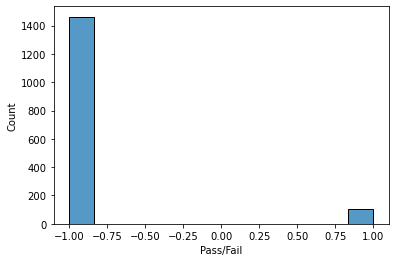

In [9]:
sns.histplot(signal_df["Pass/Fail"])

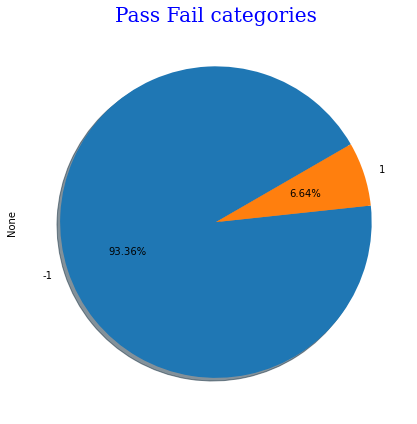

In [10]:
signal_df.groupby('Pass/Fail').size().plot(kind='pie', subplots=True, shadow=True, startangle=30, figsize=(8,6), autopct='%1.2f%%')
font1 = {'family':'serif','color':'blue','size':20}
plt.title("Pass Fail categories", fontdict = font1)    
                
plt.tight_layout()
plt.show()


In [ ]:
#......... 1B... 5 point summary observations

1. There are 592 columns (huge set of features)
2. Time is an object column, Pass/Fail is an int64 column having 1/-1 and remaining all are floats
3. There are no specific column names and instead has only numbers as colum names other than Time & Pass/Fail columns
4. There are lots of columns with 0 values & blank (missing) values in the dataset
5. Data needs to be massaged
6. Target variable is Pass/Fail column and has 93.36% -1 and 6.64% 1, hugely imbalanced.


# 2. Data Cleansing

In [11]:
orig_signal_df = signal_df.copy()    #......... saving a copy of this dataset before modifying it

In [12]:
orig_signal_df.shape

(1567, 592)

In [17]:
signal_df['Time'].isnull().sum()

0

In [13]:
#.....2A..... to remove columns with more than 20% missing values.

drop_cols = 0
mean_cols = 0
for i in signal_df.columns:
    percent_missing = signal_df[i].isnull().sum() * 100 / len(signal_df[i])
    if (i == 'Time' or i == 'Pass/Fail'):
        print("Skipping")
    else:    
        if ( percent_missing > 0.20):
            signal_df.drop(i,axis=1,inplace=True)            
            drop_cols = drop_cols+1
        else:
            mean = signal_df[i].mean()
            signal_df[i].fillna(mean, inplace=True)   #..... Imputing with mean
            mean_cols = mean_cols+1
    

Skipping
Skipping


In [14]:
signal_df.shape  #..... this has reduced the column / feature count to 254 from 592, dropping 338 columns

(1567, 254)

In [15]:
print("dropped columns",drop_cols)  #..... 338 columns dropped.

dropped columns 338


In [16]:
print("mean imputed columns",mean_cols)  #.... 252 columns have got imputed with column means

mean imputed columns 252


In [17]:
signal_df.describe()

,8,9,10,11,12,13,14,15,16,17,...,577,582,583,584,585,586,587,588,589,Pass/Fail
count,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.0,1567.000000,1567.000000,1567.000000,1567.000000,...,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000
mean,1.462862,-0.000841,0.000146,0.964353,199.956809,0.0,9.005371,413.086035,9.907603,0.971444,...,16.642363,0.500096,0.015318,0.003847,3.067826,0.021458,0.016475,0.005283,99.670066,-0.867262
std,0.073849,0.015107,0.009296,0.012444,3.255195,0.0,2.793916,17.204591,2.401563,0.012051,...,12.485267,0.003403,0.017174,0.003719,3.576891,0.012354,0.008805,0.002866,93.861936,0.498010
min,1.191000,-0.053400,-0.034900,0.655400,182.094000,0.0,2.249300,333.448600,4.469600,0.579400,...,4.582000,0.477800,0.006000,0.001700,1.197500,-0.016900,0.003200,0.001000,0.000000,-1.000000
25%,1.411250,-0.010800,-0.005600,0.958100,198.130950,0.0,7.096750,406.131000,9.568550,0.968250,...,11.501550,0.497900,0.011600,0.003100,2.306500,0.013450,0.010600,0.003300,44.368600,-1.000000
50%,1.461600,-0.001300,0.000400,0.965800,199.537100,0.0,8.973900,412.262900,9.852000,0.972500,...,13.817900,0.500200,0.013800,0.003600,2.757700,0.020500,0.014800,0.004600,72.023000,-1.000000
75%,1.516850,0.008400,0.005900,0.971300,202.006750,0.0,10.858700,419.082800,10.127750,0.976800,...,17.080900,0.502350,0.016500,0.004100,3.294950,0.027600,0.020300,0.006400,114.749700,-1.000000
max,1.656400,0.074900,0.053000,0.984800,272.045100,0.0,19.546500,824.927100,102.867700,0.984800,...,96.960100,0.509800,0.476600,0.104500,99.303200,0.102800,0.079900,0.028600,737.304800,1.000000


In [18]:
before_std_drop_signal_df = signal_df.copy()  #......... making a copy before dropping columns where Std dev is 0

In [19]:
before_std_drop_signal_df

,Time,8,9,10,11,12,13,14,15,16,...,577,582,583,584,585,586,587,588,589,Pass/Fail
0,2008-07-19 11:55:00,1.500500,0.016200,-0.003400,0.945500,202.439600,0.0,7.955800,414.871000,10.043300,...,14.9509,0.5005,0.0118,0.0035,2.3630,0.021458,0.016475,0.005283,99.670066,-1
1,2008-07-19 12:32:00,1.496600,-0.000500,-0.014800,0.962700,200.547000,0.0,10.154800,414.734700,9.259900,...,10.9003,0.5019,0.0223,0.0055,4.4447,0.009600,0.020100,0.006000,208.204500,-1
2,2008-07-19 13:17:00,1.443600,0.004100,0.001300,0.961500,202.017900,0.0,9.515700,416.707500,9.314400,...,9.2721,0.4958,0.0157,0.0039,3.1745,0.058400,0.048400,0.014800,82.860200,1
3,2008-07-19 14:43:00,1.488200,-0.012400,-0.003300,0.962900,201.848200,0.0,9.605200,422.289400,9.692400,...,8.5831,0.4990,0.0103,0.0025,2.0544,0.020200,0.014900,0.004400,73.843200,-1
4,2008-07-19 15:22:00,1.503100,-0.003100,-0.007200,0.956900,201.942400,0.0,10.566100,420.592500,10.338700,...,10.9698,0.4800,0.4766,0.1045,99.3032,0.020200,0.014900,0.004400,73.843200,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,2008-10-16 15:13:00,1.342400,-0.004500,-0.005700,0.957900,203.986700,0.0,11.769200,419.340400,10.239700,...,11.7256,0.4988,0.0143,0.0039,2.8669,0.006800,0.013800,0.004700,203.172000,-1
1563,2008-10-16 20:49:00,1.433300,-0.006100,-0.009300,0.961800,204.017300,0.0,9.162000,405.817800,10.228500,...,17.8379,0.4975,0.0131,0.0036,2.6238,0.006800,0.013800,0.004700,203.172000,-1
1564,2008-10-17 05:26:00,1.462862,-0.000841,0.000146,0.964353,199.956809,0.0,9.005371,413.086035,9.907603,...,17.7267,0.4987,0.0153,0.0041,3.0590,0.019700,0.008600,0.002500,43.523100,-1
1565,2008-10-17 06:01:00,1.462200,-0.007200,0.003200,0.969400,197.244800,0.0,9.735400,401.915300,9.863000,...,19.2104,0.5004,0.0178,0.0038,3.5662,0.026200,0.024500,0.007500,93.494100,-1


In [20]:
#....... 2B......... drop all the columns which have the same data in the

stddev_drop_cols = 0
for i in signal_df.columns:
    if (i == 'Time' or i == 'Pass/Fail'):
        print("Skipping")
    else:    
        std_dev = signal_df[i].std()
        if ( std_dev == 0):
            signal_df.drop(i,axis=1,inplace=True)            
            stddev_drop_cols = stddev_drop_cols+1
        

Skipping
Skipping


In [21]:
stddev_drop_cols  #........ found 16 columns with absolutely no data variance at all.

16

In [22]:
signal_df.shape   #............ features now reduced to 238 from 254 levels

(1567, 238)

In [23]:
signal_df.drop('Time',axis=1,inplace=True)   #........ dropping Time as it does not add any value to the dataset

In [24]:
signal_df.shape

(1567, 237)

In [25]:
before_var_drop_signal_df = signal_df.copy()

In [26]:
#......... 2C...... Dropping all the features in which variance is less than or equal to 2%

var_drop_cols = 0
#variable = [ ]
variable_df = pd.DataFrame(columns = ['column', 'variance'])
ind = 0

for i in signal_df.columns:
    if (i == 'Pass/Fail'):
        print("Skipping")
    else:    
        var = signal_df[i].var() * 100
        print("column is",i)
        print("variance of column is",var)
        tempResultsDf = pd.DataFrame({'column':i,'variance': var}, index=[ind])
        ind = ind+1
            
        variable_df = pd.concat([variable_df, tempResultsDf])
            
        variable_df = variable_df[['column','variance']]
            
        #variable.append(i,var)
        if ( var <= 0.02):
            signal_df.drop(i,axis=1,inplace=True)      #..... dropping columns with variance less than 2%
            var_drop_cols = var_drop_cols+1

column is 8
variance of column is 0.5453727726488192
column is 9
variance of column is 0.02282073603858347
column is 10
variance of column is 0.008641864894176945
column is 11
variance of column is 0.015485556858808786
column is 12
variance of column is 1059.629456076349
column is 14
variance of column is 780.5964129675081
column is 15
variance of column is 29599.7963687687
column is 16
variance of column is 576.750472972389
column is 17
variance of column is 0.014522306021417356
column is 18
variance of column is 771.9371004655143
column is 20
variance of column is 0.028012491013976855
column is 21
variance of column is 39240424.754859574
column is 22
variance of column is 8720786.490080751
column is 23
variance of column is 190241479.8748207
column is 24
variance of column is 841484924.132007
column is 25
variance of column is 3.1501645535766016
column is 26
variance of column is 3.5862513249058647
column is 27
variance of column is 154.61790398174716
column is 28
variance of column 

column is 386
variance of column is 0.02398822808548924
column is 387
variance of column is 0.002489345869184108
column is 388
variance of column is 29676.963993352932
column is 389
variance of column is 0.013961795973955034
column is 390
variance of column is 41316.31519193336
column is 392
variance of column is 0.0008735296297111316
column is 393
variance of column is 0.14752123041889648
column is 417
variance of column is 1641.809832242191
column is 418
variance of column is 8266815.544597451
column is 419
variance of column is 10578138.507837297
column is 420
variance of column is 933.7541463429861
column is 421
variance of column is 4774.0345053981155
column is 423
variance of column is 106052.44772774345
column is 424
variance of column is 3993.359560451612
column is 425
variance of column is 53988.508698736
column is 426
variance of column is 98.93603564492076
column is 427
variance of column is 923.691392958423
column is 429
variance of column is 4141.42508045685
column is 430


In [27]:
variable_df

,column,variance
0,8,0.545373
1,9,0.022821
2,10,0.008642
3,11,0.015486
4,12,1059.629456
...,...,...
231,585,1279.414606
232,586,0.015263
233,587,0.007752
234,588,0.000821


In [28]:
variable_df.sort_values(by=['variance'], ascending=True)

,column,variance
214,544,8.722063e-06
151,377,2.173816e-05
150,376,2.851653e-05
45,104,7.227809e-05
98,239,2.074996e-04
...,...,...
119,296,3.896083e+08
14,24,8.414849e+08
120,297,1.039974e+09
66,161,1.794825e+09


In [29]:
variable_df[variable_df['variance'] < 0.02].count()

column      38
variance    38
dtype: int64

In [30]:
var_drop_cols

38

In [31]:
signal_df.shape #........ features set has been brought down to 199 after dropping 38 columns with less than 2% variance

(1567, 199)

In [32]:
signal_df.describe()

,8,9,12,14,15,16,18,20,21,22,...,572,573,574,575,576,577,583,585,589,Pass/Fail
count,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,...,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000
mean,1.462862,-0.000841,199.956809,9.005371,413.086035,9.907603,190.047354,1.405054,-5618.393610,2699.378435,...,28.450165,0.345636,9.162315,0.104729,5.563747,16.642363,0.015318,3.067826,99.670066,-0.867262
std,0.073849,0.015107,3.255195,2.793916,17.204591,2.401563,2.778376,0.016737,626.421781,295.309778,...,86.304681,0.248478,26.920150,0.067791,16.921369,12.485267,0.017174,3.576891,93.861936,0.498010
min,1.191000,-0.053400,182.094000,2.249300,333.448600,4.469600,169.177400,1.179700,-7150.250000,0.000000,...,3.540000,0.066700,1.039500,0.023000,0.663600,4.582000,0.006000,1.197500,0.000000,-1.000000
25%,1.411250,-0.010800,198.130950,7.096750,406.131000,9.568550,188.300650,1.396500,-5932.625000,2578.125000,...,7.500000,0.242250,2.567850,0.075100,1.408450,11.501550,0.011600,2.306500,44.368600,-1.000000
50%,1.461600,-0.001300,199.537100,8.973900,412.262900,9.852000,189.675700,1.406000,-5523.250000,2664.000000,...,8.650000,0.293400,2.975800,0.089500,1.624500,13.817900,0.013800,2.757700,72.023000,-1.000000
75%,1.516850,0.008400,202.006750,10.858700,419.082800,10.127750,192.178900,1.415000,-5356.625000,2840.625000,...,10.130000,0.366900,3.492500,0.112150,1.902000,17.080900,0.016500,3.294950,114.749700,-1.000000
max,1.656400,0.074900,272.045100,19.546500,824.927100,102.867700,215.597700,1.453400,0.000000,3656.250000,...,454.560000,2.196700,170.020400,0.550200,90.423500,96.960100,0.476600,99.303200,737.304800,1.000000


In [33]:
before_bi_variate_signal_df = signal_df.copy()

In [34]:
before_bi_variate_signal_df.shape

(1567, 199)

In [35]:
#....... 2D......... Bivariate checking of all predictors with target (Pass/Fail) column

corr_drop_cols = 0
corr_df = pd.DataFrame(columns = ['column', 'correlation'])
ind = 0

for i in signal_df.columns:
    if (i == 'Pass/Fail'):
        print("Skipping")
    else:
        corr_val = signal_df['Pass/Fail'].corr(signal_df[i])
        corr_val = round(corr_val,3)
        print("column is",i)
        print("correlation of column is",corr_val)
        tempResultsDf = pd.DataFrame({'column':i,'correlation': corr_val}, index=[ind])
        ind = ind+1
            
        corr_df = pd.concat([corr_df, tempResultsDf])
            
        corr_df = corr_df[['column','correlation']]

column is 8
correlation of column is 0.028
column is 9
correlation of column is -0.031
column is 12
correlation of column is -0.006
column is 14
correlation of column is -0.069
column is 15
correlation of column is -0.003
column is 16
correlation of column is 0.002
column is 18
correlation of column is -0.009
column is 20
correlation of column is 0.023
column is 21
correlation of column is 0.108
column is 22
correlation of column is -0.073
column is 23
correlation of column is 0.013
column is 24
correlation of column is -0.018
column is 25
correlation of column is -0.036
column is 26
correlation of column is -0.081
column is 27
correlation of column is -0.029
column is 28
correlation of column is -0.107
column is 29
correlation of column is 0.017
column is 30
correlation of column is 0.037
column is 31
correlation of column is -0.049
column is 32
correlation of column is 0.052
column is 33
correlation of column is 0.081
column is 34
correlation of column is 0.003
column is 35
correlati

column is 570
correlation of column is -0.002
column is 571
correlation of column is -0.019
column is 572
correlation of column is -0.032
column is 573
correlation of column is -0.052
column is 574
correlation of column is -0.035
column is 575
correlation of column is -0.053
column is 576
correlation of column is -0.028
column is 577
correlation of column is -0.05
column is 583
correlation of column is 0.006
column is 585
correlation of column is 0.005
column is 589
correlation of column is -0.003
Skipping


In [36]:
corr_df.shape

(198, 2)

In [37]:
negative_corr_df = corr_df[corr_df['correlation'] <= 0]

In [38]:
negative_corr_df.shape

(99, 2)

In [39]:
negative_corr_df.sort_values(by=['correlation'], ascending=True).head(30) 

#..... the negative corelations do not seem to be strong...........
#..... strongest possible negatively corelated column seems to be column 28 with a corelation of -0.107
#..... the remaining 99 columns which are negatively corelated seems to be going much more closer to 0


,column,correlation
15,28,-0.107
114,316,-0.089
13,26,-0.081
70,180,-0.079
159,452,-0.077
9,22,-0.073
3,14,-0.069
192,575,-0.053
190,573,-0.052
194,577,-0.050


In [40]:
negative_corr_df.sort_values(by=['correlation'], ascending=False).head(50)

#........ these are the worst possible negatively correlated features and can be dropped as they do not 
#........ contribute in any way to the Target dependent variable "Pass/Fail"

,column,correlation
139,429,0.000
94,291,0.000
81,223,-0.001
26,39,-0.002
187,570,-0.002
109,308,-0.002
197,589,-0.003
128,393,-0.003
23,36,-0.003
93,289,-0.003


In [41]:
worst_50_negative_df = negative_corr_df.sort_values(by=['correlation'], ascending=False).head(50)

In [42]:
worst_50_negative_df["column"]

139    429
94     291
81     223
26      39
187    570
109    308
197    589
128    393
23      36
93     289
113    312
4       15
170    495
158    448
98     297
69     177
92     287
133    421
124    361
48     152
45     148
179    524
2       12
54     162
65     173
154    444
86     252
150    440
127    390
167    490
89     283
164    457
105    304
30      46
75     185
6       18
85     251
181    527
178    523
122    356
119    321
61     169
22      35
46     150
87     255
90     285
152    442
68     176
78     218
157    447
Name: column, dtype: object

In [43]:
signal_df.drop(worst_50_negative_df["column"],axis=1,inplace=True) 

#.... dropping the worst negatively corelated 50 columns

In [44]:
signal_df.shape #............. with the dropping of 50 columns the independent variable has reduced to 149

(1567, 149)

In [45]:
positive_corr_df = corr_df[corr_df['correlation'] > 0]

In [46]:
positive_corr_df.shape

(99, 2)

In [47]:
positive_corr_df.sort_values(by=['correlation'], ascending=False).head(10)

#....... like the Negative corelation even the positive corelations also does not look any great
#....... with the best possible positively correlated column 510 having a corelation of 0.132

,column,correlation
173,510,0.132
141,431,0.120
144,434,0.112
140,430,0.110
145,435,0.109
8,21,0.108
146,436,0.106
99,298,0.102
55,163,0.100
96,295,0.092


In [48]:
positive_corr_df.sort_values(by=['correlation'], ascending=True).head(50)

#......... the worst positively corelated independent features with the dependent variable Pass/Fail...
#......... these can also be dropped from signal_df as they do not contribute anything at all to the dependent variable

,column,correlation
163,456,0.001
138,427,0.001
5,16,0.002
50,156,0.002
49,154,0.002
74,184,0.003
21,34,0.003
63,171,0.003
118,320,0.003
107,306,0.003


In [49]:
worst_50_positive_df = positive_corr_df.sort_values(by=['correlation'], ascending=True).head(50)

In [50]:
worst_50_positive_df

,column,correlation
163,456,0.001
138,427,0.001
5,16,0.002
50,156,0.002
49,154,0.002
74,184,0.003
21,34,0.003
63,171,0.003
118,320,0.003
107,306,0.003


In [51]:
signal_df.drop(worst_50_positive_df["column"],axis=1,inplace=True) 

#.......... dropping the worst 50 positively corelated columns

In [52]:
signal_df.shape #......... after dropping the worst 50 positive correlation columns, the overall features have reduced to 99

(1567, 99)

In [53]:
before_vif_drop_df = signal_df.copy()

In [54]:
before_vif_drop_df.shape

(1567, 99)

In [55]:
X = signal_df.drop("Pass/Fail",axis=1)

In [56]:
X.shape

(1567, 98)

In [57]:
# 2E....

#  Checking the Variance inflation factor and deleting the the column with Highest VIF and looping through 80 times 

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()

end = len(X.columns) * 0.80
end = int(end)

for knt in range(1,end):

    print("knt is",knt)
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(signal_df.values, i) for i in range(X.shape[1])]
    max_vif = vif[vif.loc[:,'VIF'] == vif['VIF'].max()]
    index_names = vif[ vif['VIF'] == vif['VIF' ].max()].index
    
    print("max variable",max_vif['variables'])
    print("index_names",index_names)
    
    X.drop(max_vif['variables'],axis=1,inplace=True)
    vif = vif.drop(index_names,inplace=True)
    vif = pd.DataFrame()
    
    

knt is 1
max variable 37    174
Name: variables, dtype: object
index_names Int64Index([37], dtype='int64')
knt is 2
max variable 37    175
Name: variables, dtype: object
index_names Int64Index([37], dtype='int64')
knt is 3
max variable 37    180
Name: variables, dtype: object
index_names Int64Index([37], dtype='int64')
knt is 4
max variable 37    181
Name: variables, dtype: object
index_names Int64Index([37], dtype='int64')
knt is 5
max variable 37    182
Name: variables, dtype: object
index_names Int64Index([37], dtype='int64')
knt is 6
max variable 37    183
Name: variables, dtype: object
index_names Int64Index([37], dtype='int64')
knt is 7
max variable 37    188
Name: variables, dtype: object
index_names Int64Index([37], dtype='int64')
knt is 8
max variable 37    222
Name: variables, dtype: object
index_names Int64Index([37], dtype='int64')
knt is 9
max variable 37    249
Name: variables, dtype: object
index_names Int64Index([37], dtype='int64')
knt is 10
max variable 37    279
Name

max variable 13    151
Name: variables, dtype: object
index_names Int64Index([13], dtype='int64')


In [58]:
X.shape # this identified 77 VIF high columns and dropped them from the dataset reducing the Independent variables to 21

(1567, 21)

In [60]:
X

,9,14,21,22,24,25,26,27,28,30,...,32,33,159,160,161,163,164,165,166,170
0,0.016200,7.955800,-5419.00,2916.50,751.00,0.8955,1.7730,3.0490,64.2333,0.1632,...,83.3971,9.5126,1017.0,967.0,1066.0,0.090,0.048,0.095,2.0,0.7250
1,-0.000500,10.154800,-5441.50,2604.25,-1640.25,1.2973,2.0143,7.3900,68.4222,0.2102,...,84.9052,9.7997,568.0,59.0,297.0,0.112,0.115,0.124,2.2,1.0498
2,0.004100,9.515700,-5447.75,2701.75,-1916.50,1.3122,2.0295,7.5788,67.1333,0.1734,...,84.7569,8.6590,562.0,788.0,759.0,0.187,0.117,0.068,2.1,1.0824
3,-0.012400,9.605200,-5468.25,2648.25,-1657.25,1.3137,2.0038,7.3145,62.9333,0.2071,...,84.9105,8.6789,859.0,355.0,3433.0,0.068,0.108,0.100,1.7,0.9386
4,-0.003100,10.566100,-5476.25,2635.25,117.00,1.2887,1.9912,7.2748,62.8333,0.2696,...,86.3269,8.7677,699.0,283.0,1747.0,0.147,0.040,0.113,3.9,0.5760
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,-0.004500,11.769200,-5418.75,2608.00,356.00,1.2817,1.9540,7.0793,71.1444,0.1753,...,83.8405,8.7164,1280.0,334.0,7112.0,0.123,0.159,0.260,5.9,0.7184
1563,-0.006100,9.162000,-6408.75,2277.50,339.00,1.0870,1.8023,5.1515,72.8444,0.1416,...,84.0623,8.9607,504.0,94.0,315.0,0.055,0.043,0.268,2.7,0.6214
1564,-0.000841,9.005371,-5153.25,2707.00,-1226.00,1.2930,1.9435,7.2315,71.2667,0.1659,...,85.8638,8.1728,1178.0,542.0,3662.0,0.109,0.074,0.273,3.2,0.6512
1565,-0.007200,9.735400,-5271.75,2676.50,394.75,1.2875,1.9880,7.3255,70.5111,0.2386,...,84.5602,9.1930,1740.0,252.0,2702.0,0.098,0.193,0.250,2.2,0.3993


In [61]:
X.describe()

,9,14,21,22,24,25,26,27,28,30,...,32,33,159,160,161,163,164,165,166,170
count,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,...,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000
mean,-0.000841,9.005371,-5618.393610,2699.378435,-298.598136,1.203845,1.938477,6.638628,69.499532,0.184159,...,85.337469,8.960279,882.680511,555.346326,4066.850479,0.140204,0.127942,0.252026,2.788882,0.684330
std,0.015107,2.793916,626.421781,295.309778,2900.835956,0.177487,0.189374,1.243454,3.458970,0.032923,...,2.025902,1.344027,982.415079,574.441416,4236.537140,0.121911,0.242379,0.407069,1.119041,0.157418
min,-0.053400,2.249300,-7150.250000,0.000000,-14804.500000,0.000000,0.000000,0.000000,59.400000,0.034100,...,83.182900,7.603200,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.800000,0.297900
25%,-0.010800,7.096750,-5932.625000,2578.125000,-1474.375000,1.094900,1.906750,5.267350,67.383350,0.161800,...,84.490500,8.580000,411.500000,295.000000,1322.500000,0.091000,0.068500,0.132000,2.100000,0.575600
50%,-0.001300,8.973900,-5523.250000,2664.000000,-80.500000,1.283000,1.986300,7.264500,69.155600,0.186700,...,85.140400,8.770000,623.000000,438.000000,2620.000000,0.120000,0.089000,0.184000,2.600000,0.686000
75%,0.008400,10.858700,-5356.625000,2840.625000,1376.250000,1.304300,2.003200,7.329600,72.255550,0.207000,...,85.741900,9.060600,963.500000,624.500000,5033.000000,0.154000,0.116500,0.254500,3.200000,0.797300
max,0.074900,19.546500,0.000000,3656.250000,14106.000000,1.382800,2.052800,7.658800,77.900000,0.285100,...,105.603800,23.345300,7791.000000,4170.000000,37943.000000,0.957000,1.817000,3.286000,21.100000,1.153000


In [62]:
signal_df.shape

(1567, 99)

In [63]:
backup_X = X.copy()

In [64]:
backup_X.shape

(1567, 21)

In [65]:
signal_new = X.copy()

In [67]:
signal_new.shape  # With this we have successfully brought down the dataset from a high of 592 to 21

(1567, 21)

In [68]:
signal_new['Pass/Fail'] = signal_df['Pass/Fail'].values #........... adding the Target variable Pass/Fail to signal_new

In [69]:
signal_new['Pass/Fail'].value_counts()

-1    1463
 1     104
Name: Pass/Fail, dtype: int64

In [70]:
signal_df['Pass/Fail'].value_counts()

-1    1463
 1     104
Name: Pass/Fail, dtype: int64

# 3. Data Analysis & Visualization

In [ ]:
# 3A.... Univariate Analysis

<ipython-input-71-e513aad3098c>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (10,5))


<Figure size 432x288 with 0 Axes>

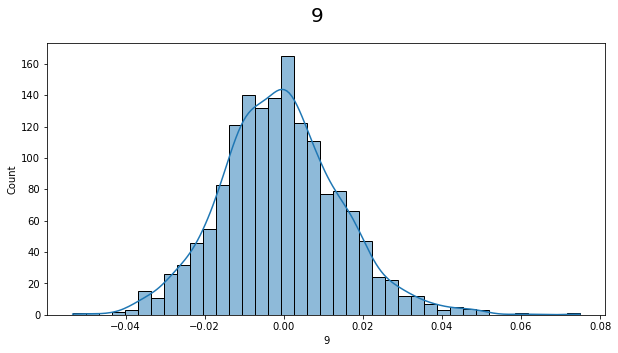

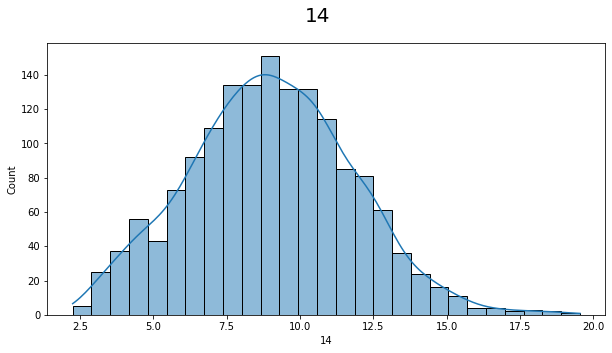

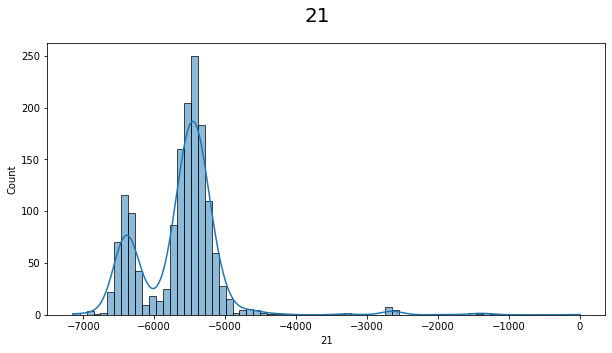

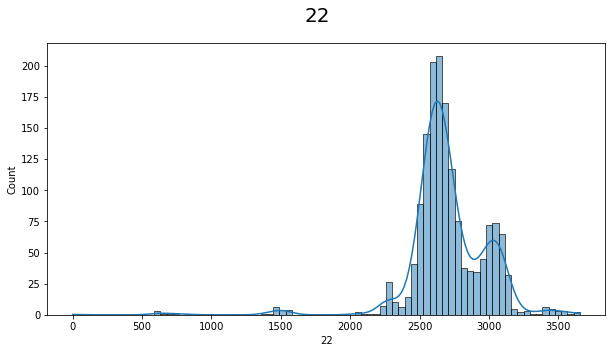

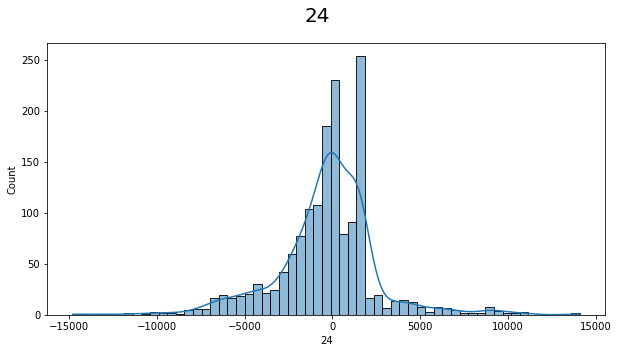

...

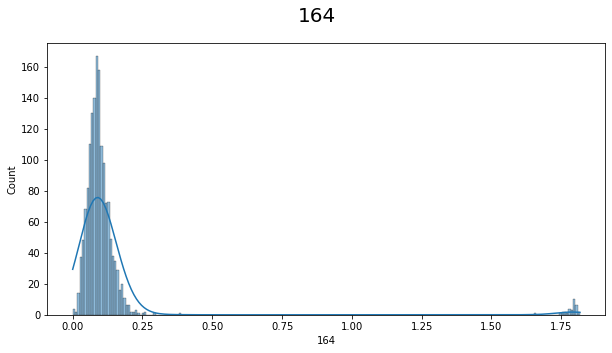

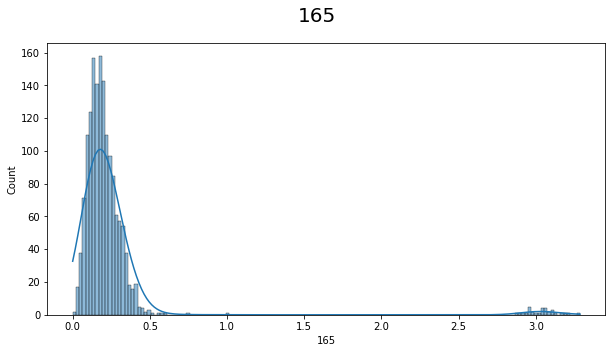

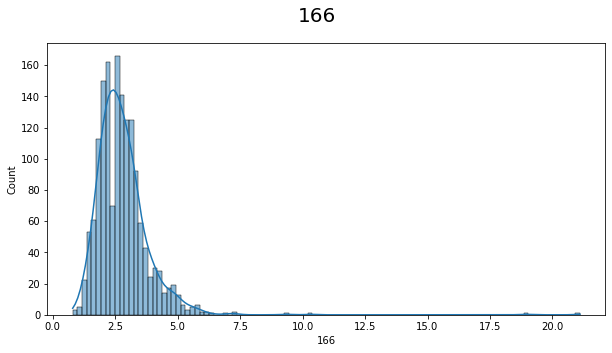

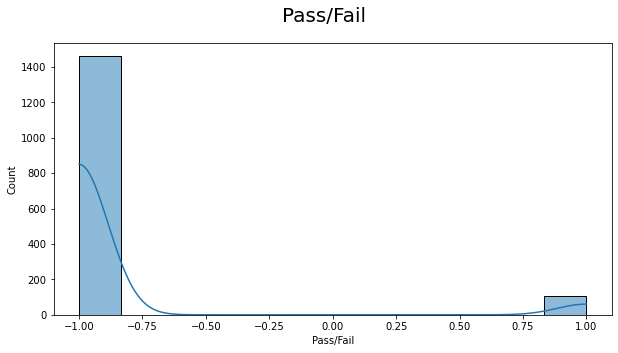

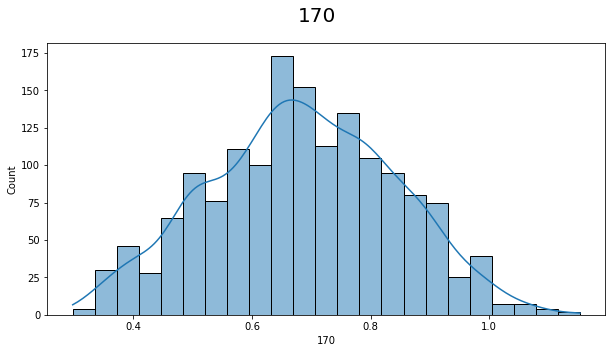

In [71]:
for i, col in enumerate(signal_new.columns):
    fig = plt.figure(figsize = (10,5))
    plt.figure(i)
    ax = fig.gca()
    fig.suptitle(col, fontsize=20)
    sns.histplot(signal_new[col], kde=True, ax=ax)

Observations:
    
    1. Column 9, 14, 30, 170 seem to be normally distributed
    2. Column 32, 33, 160 is normally distributed with a huge right skew
    3. Column 31, 21, 22, 25, seem to have 2 clusters
    4. Column 27 seems to have 2 clusters and is left skewed
    5. Column 26 seems to have 3 clusters
    6. Column 161 is right skewed
    7. Colulmn 163, 164, 165, 166 have 2 clusters with 1 normally distrubuted and the other very small with a right skew

column is 9


<Figure size 432x288 with 0 Axes>

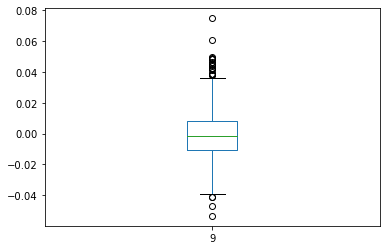

column is 14


<Figure size 432x288 with 0 Axes>

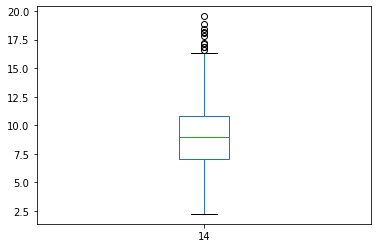

column is 21


<Figure size 432x288 with 0 Axes>

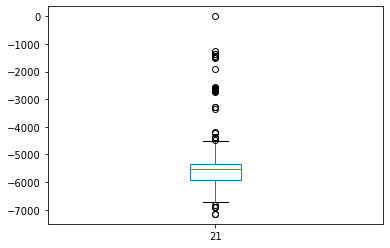

column is 22


<Figure size 432x288 with 0 Axes>

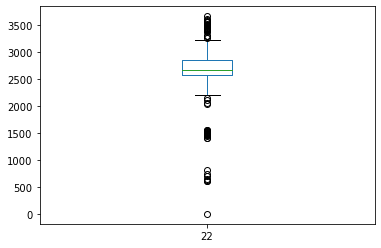

column is 24


<Figure size 432x288 with 0 Axes>

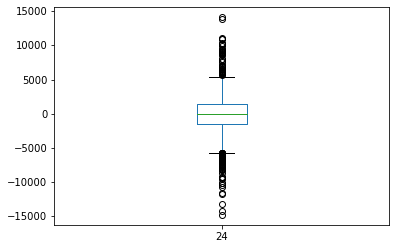

column is 25


<Figure size 432x288 with 0 Axes>

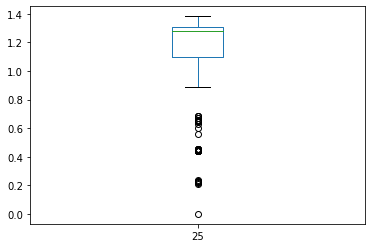

column is 26


<Figure size 432x288 with 0 Axes>

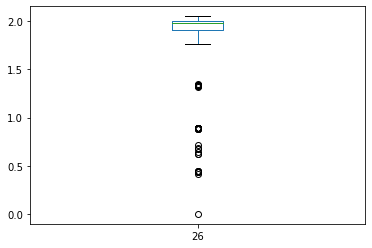

column is 27


<Figure size 432x288 with 0 Axes>

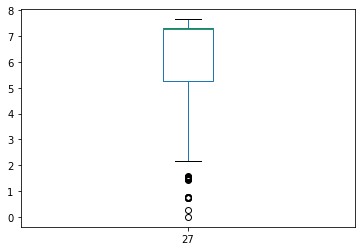

column is 28


<Figure size 432x288 with 0 Axes>

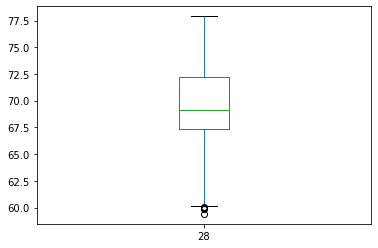

column is 30


<Figure size 432x288 with 0 Axes>

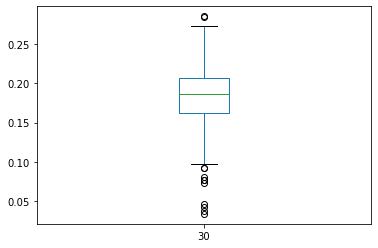

column is 31


<Figure size 432x288 with 0 Axes>

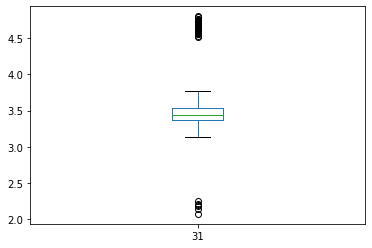

column is 32


<Figure size 432x288 with 0 Axes>

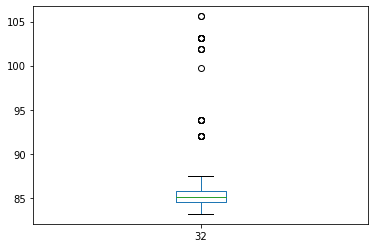

column is 33


<Figure size 432x288 with 0 Axes>

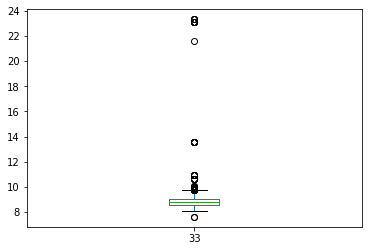

column is 159


<Figure size 432x288 with 0 Axes>

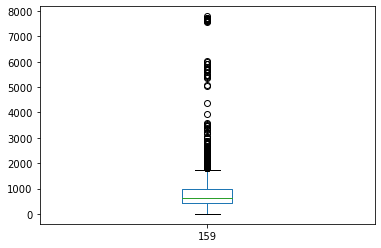

column is 160


<Figure size 432x288 with 0 Axes>

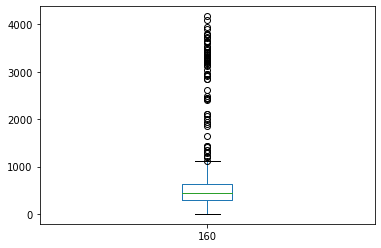

column is 161


<Figure size 432x288 with 0 Axes>

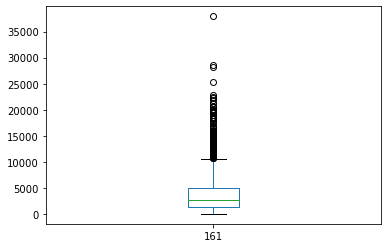

column is 163


<Figure size 432x288 with 0 Axes>

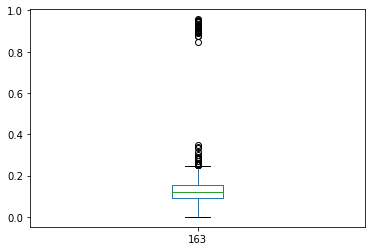

column is 164


<Figure size 432x288 with 0 Axes>

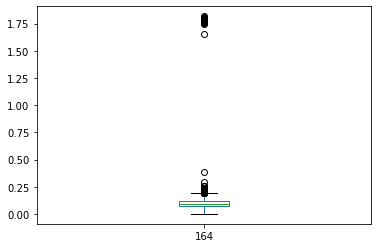

column is 165


<Figure size 432x288 with 0 Axes>

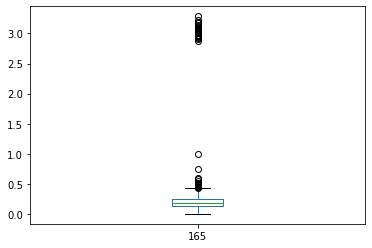

column is 166


<Figure size 432x288 with 0 Axes>

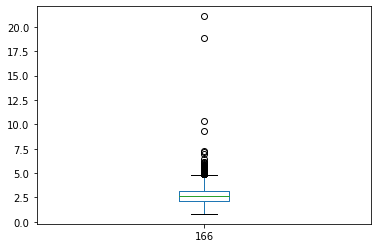

column is 170


<Figure size 432x288 with 0 Axes>

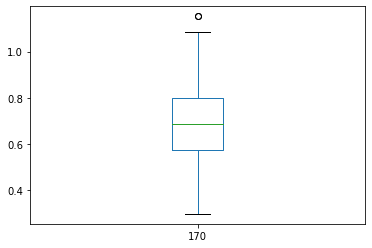

column is Pass/Fail


<Figure size 432x288 with 0 Axes>

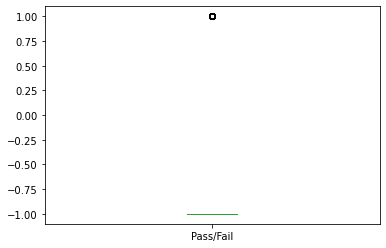

In [72]:
for i in signal_new.columns:    
    print("column is",i)
    fig = plt.figure(figsize = (6,4))
    plt.figure(i)
    fig.suptitle(i, fontsize=20)
    signal_new[i].plot.box()
    plt.show()
    
        

In [74]:
# Observations:
#    1. There are too many outliers in all the columns
#    2. Column 21, 22, 24 seems to have huge outliers on both sides
#    3. Column 14, 32, 33 has outliers only above Maximum
#    4. Column 25, 26, 27 has outliers only below minimum
#    5. Column 28, 30 seems to be ok with just very few outliers below minimum
#    6. Column 31 is equally distributed with outliers above and below maximum and minimum
#    7. Column 159, 160, 161 has too many outliers above maximum
#    8. Column 163, 164, 165, 166 has too many outliers above maximum with clearly 2 bunches with a significant gap
#    9. Column 170 seems to have only 1 outlier with perfect data distribution

In [75]:
signal_new.shape

(1567, 22)

In [76]:
for i in signal_new.columns:
    if (i == 'Pass/Fail'):
        print("")
    else:
        Q1 = np.percentile(signal_new[i], 25,interpolation = 'midpoint')
 
        Q3 = np.percentile(signal_new[i], 75,interpolation = 'midpoint')
    
        IQR = Q3 - Q1
        
        # Upper bound
        #upper = np.where(signal_new[i] >= (Q3+1.5*IQR))
        upper = (Q3+1.5*IQR)
        # Lower bound
        #lower = np.where(signal_new[i] <= (Q1-1.5*IQR))
        lower = (Q1-1.5*IQR)
        
        curr_val = signal_new[i]
        median = signal_new[i].quantile(0.50)
                        
        print("column is",i)
        print("Median is",median) 
        print("Upper bound is",upper)
        print("Lower bound is",lower)
        
        signal_new[i] = np.where(signal_new[i] >= upper, median, curr_val)
        signal_new[i] = np.where(signal_new[i] <= lower, median, curr_val)
    

column is 9
Median is -0.0013
Upper bound is 0.037200000000000004
Lower bound is -0.0396
column is 14
Median is 8.9739
Upper bound is 16.501624999999997
Lower bound is 1.453825000000002
column is 21
Median is -5523.25
Upper bound is -4492.625
Lower bound is -6796.625
column is 22
Median is 2664.0
Upper bound is 3234.375
Lower bound is 2184.375
column is 24
Median is -80.5
Upper bound is 5652.1875
Lower bound is -5750.3125
column is 25
Median is 1.283
Upper bound is 1.6184
Lower bound is 0.7807999999999999
column is 26
Median is 1.9863
Upper bound is 2.147875
Lower bound is 1.7620750000000003
column is 27
Median is 7.2645
Upper bound is 10.422975
Lower bound is 2.173975000000001
column is 28
Median is 69.1556
Upper bound is 79.56384999999999
Lower bound is 60.07505000000002
column is 30
Median is 0.1867
Upper bound is 0.27480000000000004
Lower bound is 0.09399999999999997
column is 31
Median is 3.4314
Upper bound is 3.7897000000000007
Lower bound is 3.1064999999999996
column is 32
Media

column is 9


<Figure size 432x288 with 0 Axes>

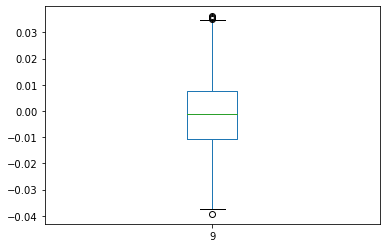

column is 14


<Figure size 432x288 with 0 Axes>

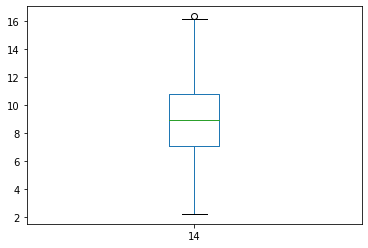

column is 21


<Figure size 432x288 with 0 Axes>

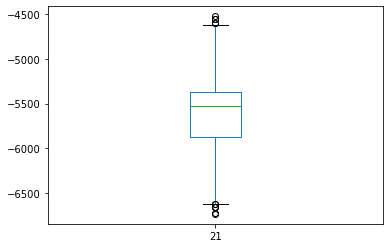

column is 22


<Figure size 432x288 with 0 Axes>

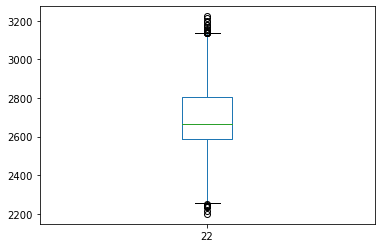

column is 24


<Figure size 432x288 with 0 Axes>

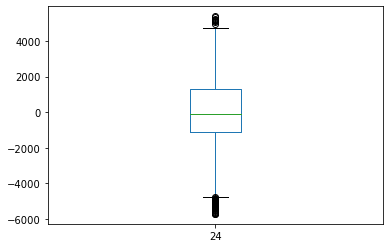

column is 25


<Figure size 432x288 with 0 Axes>

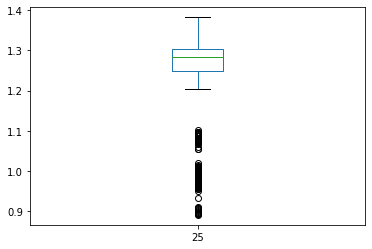

column is 26


<Figure size 432x288 with 0 Axes>

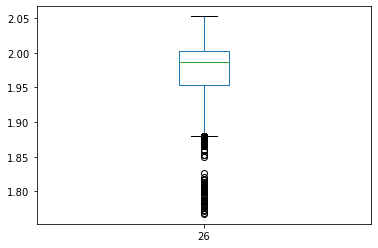

column is 27


<Figure size 432x288 with 0 Axes>

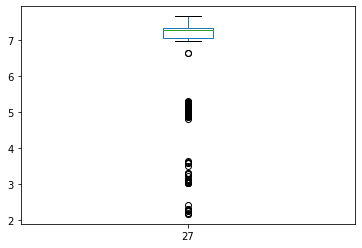

column is 28


<Figure size 432x288 with 0 Axes>

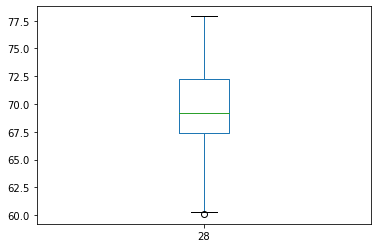

column is 30


<Figure size 432x288 with 0 Axes>

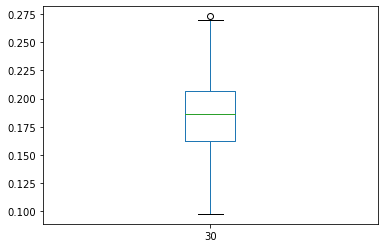

column is 31


<Figure size 432x288 with 0 Axes>

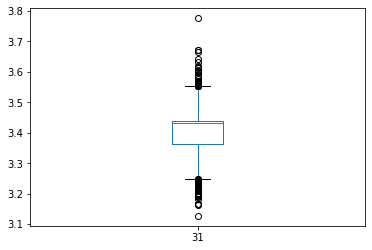

column is 32


<Figure size 432x288 with 0 Axes>

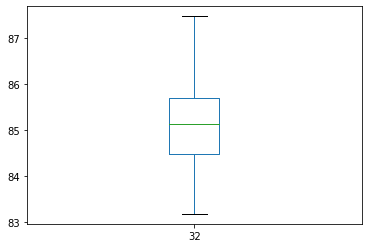

column is 33


<Figure size 432x288 with 0 Axes>

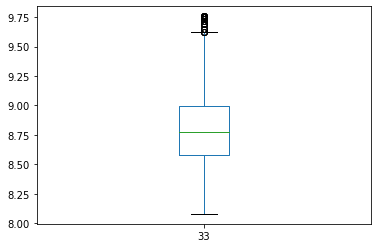

column is 159


<Figure size 432x288 with 0 Axes>

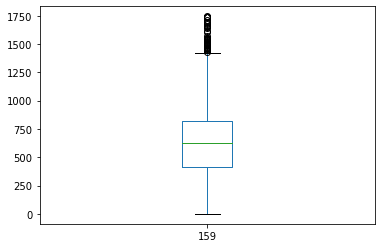

column is 160


<Figure size 432x288 with 0 Axes>

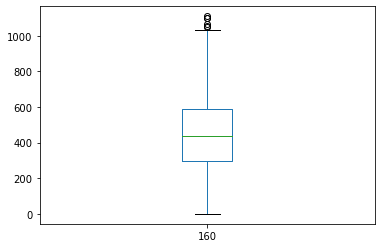

column is 161


<Figure size 432x288 with 0 Axes>

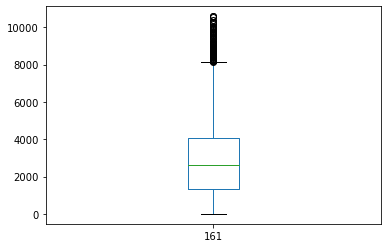

column is 163


<Figure size 432x288 with 0 Axes>

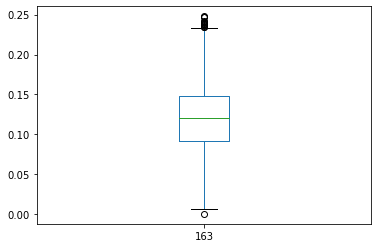

column is 164


<Figure size 432x288 with 0 Axes>

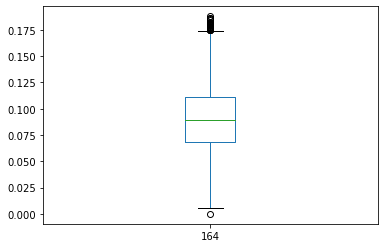

column is 165


<Figure size 432x288 with 0 Axes>

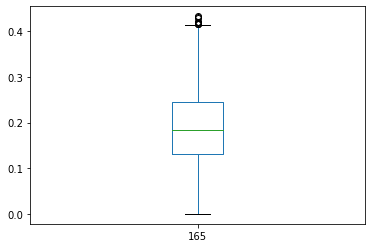

column is 166


<Figure size 432x288 with 0 Axes>

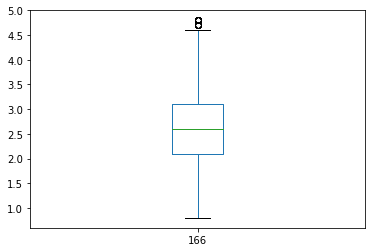

column is 170


<Figure size 432x288 with 0 Axes>

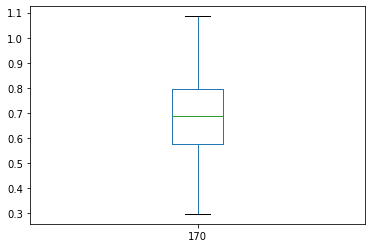

column is Pass/Fail


<Figure size 432x288 with 0 Axes>

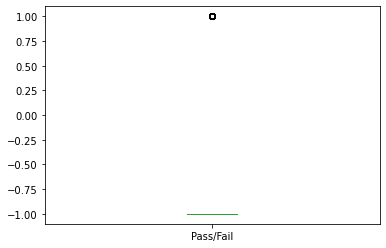

In [77]:
for i in signal_new.columns:    
    print("column is",i)
    fig = plt.figure(figsize = (6,4))
    plt.figure(i)
    fig.suptitle(i, fontsize=20)
    signal_new[i].plot.box()
    plt.show()
    

In [ ]:
# Most of the outliers have been taken care but for some of the residual outliers 

column is 9


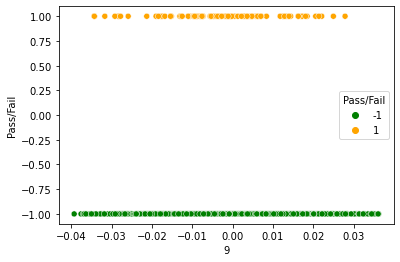

column is 14


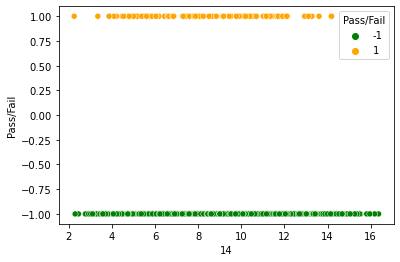

column is 21


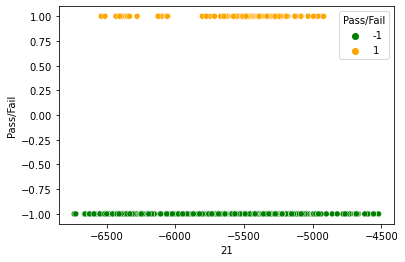

column is 22


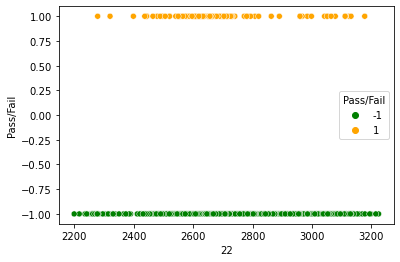

column is 24


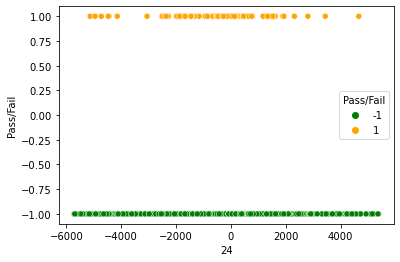

column is 25


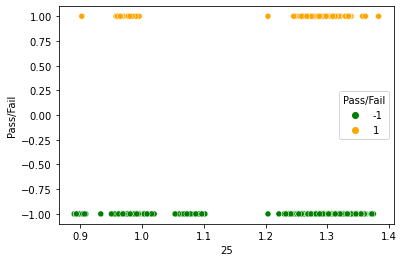

column is 26


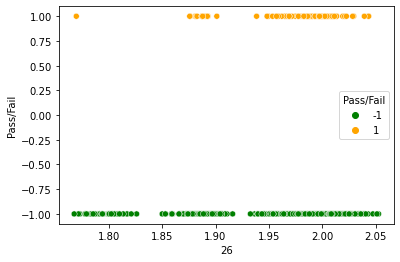

column is 27


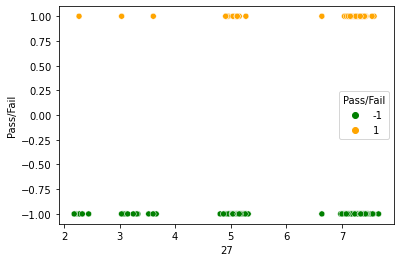

column is 28


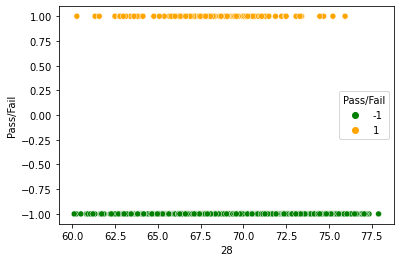

column is 30


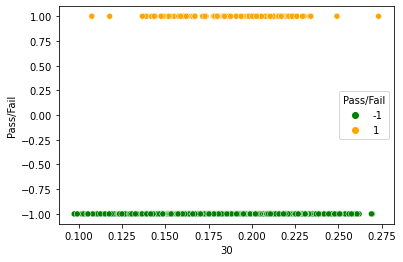

column is 31


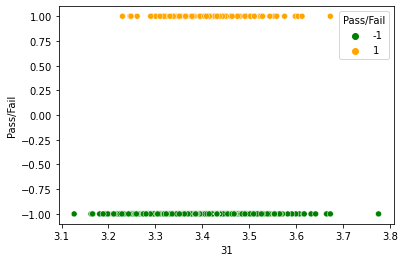

column is 32


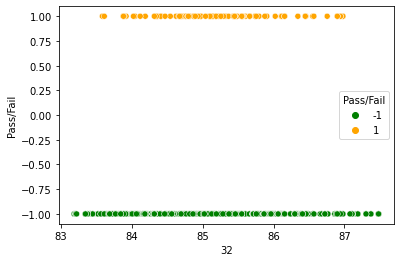

column is 33


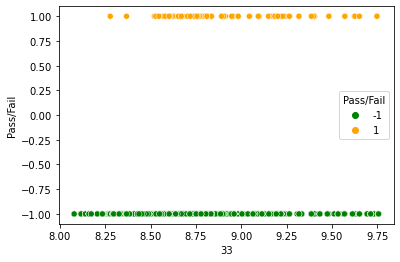

column is 159


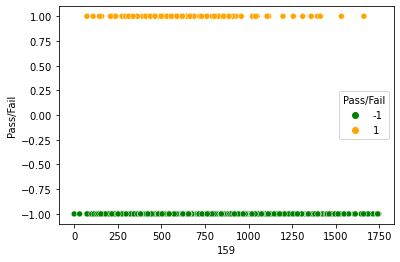

column is 160


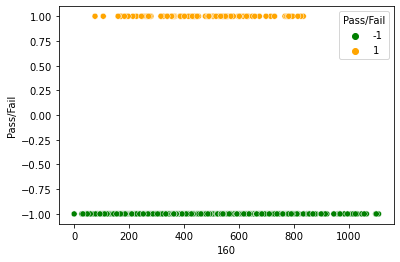

column is 161


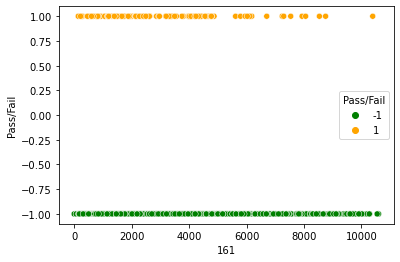

column is 163


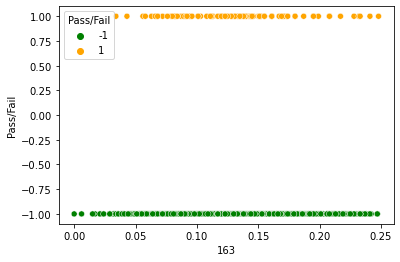

column is 164


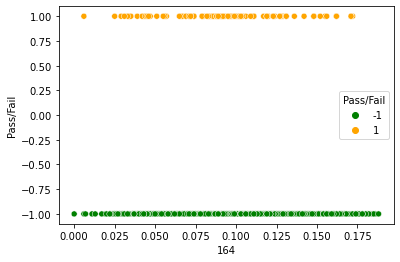

column is 165


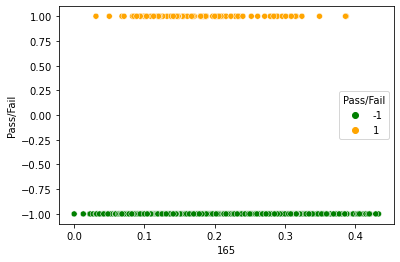

column is 166


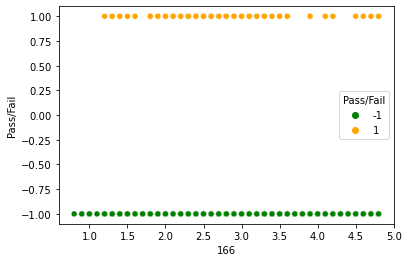

column is 170


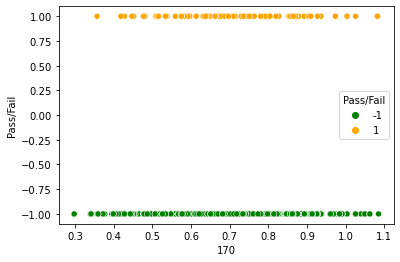

Nothing Pass/Fail


In [78]:
#..... 3B..... Bivariate analysis.... Checking each independent variable with dependent variable ("Pass/Fail")

for i in signal_new.columns:
    if i == 'Pass/Fail':
        print("Nothing",i)
    else:    
        print("column is",i)
        plt.figure()
        #sns.jointplot(x=i, y='Pass/Fail', data=signal_new, hue='Pass/Fail');
        g=sns.scatterplot(x=i, y="Pass/Fail",hue="Pass/Fail",data=signal_new,palette=['green','orange'], legend='full')
        plt.show()
        



Observations:
    1. There doesnt seem to be any significant linear relationship between the independent and dependent variables for most
    of the columns

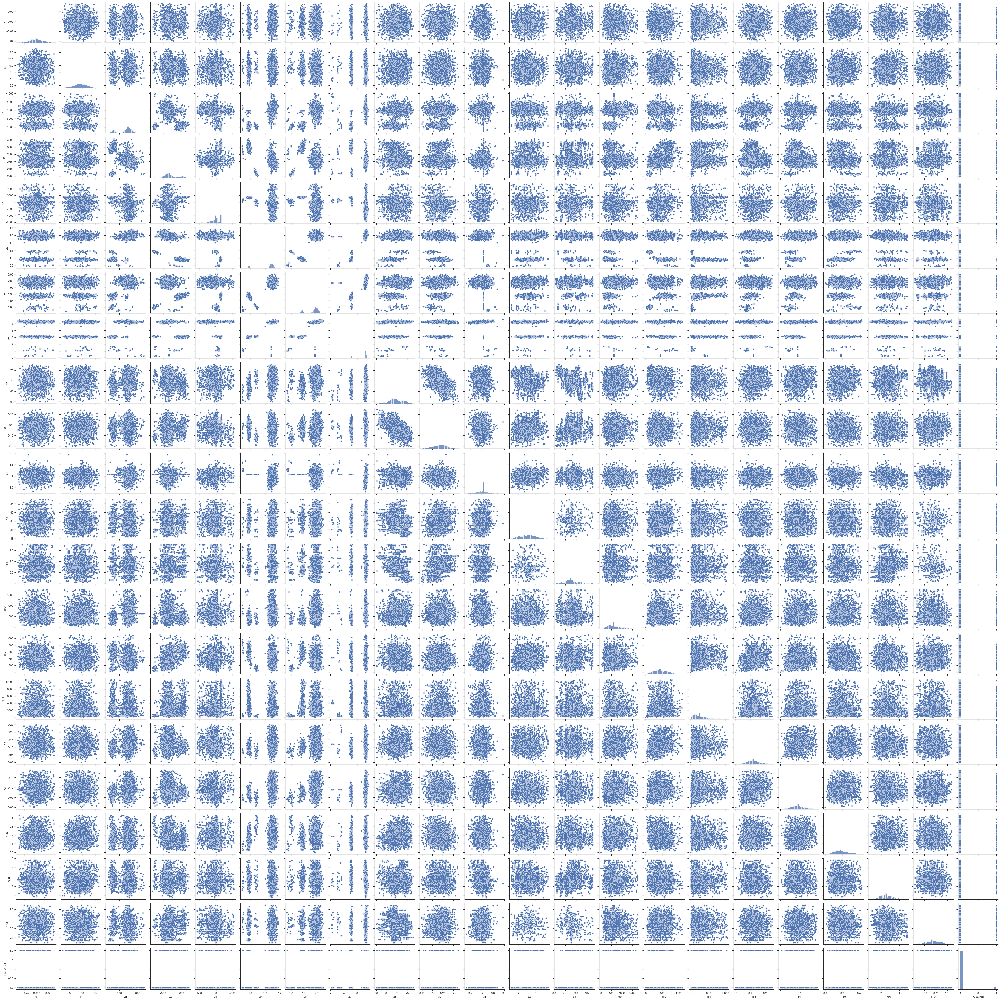

In [142]:
#.... 3B..... Multivariate analysis

sns.set(rc={'figure.figsize':(18.7,1200.27)})

sns. set(style="ticks", color_codes=True)

sns.pairplot(signal_new);


<AxesSubplot:>

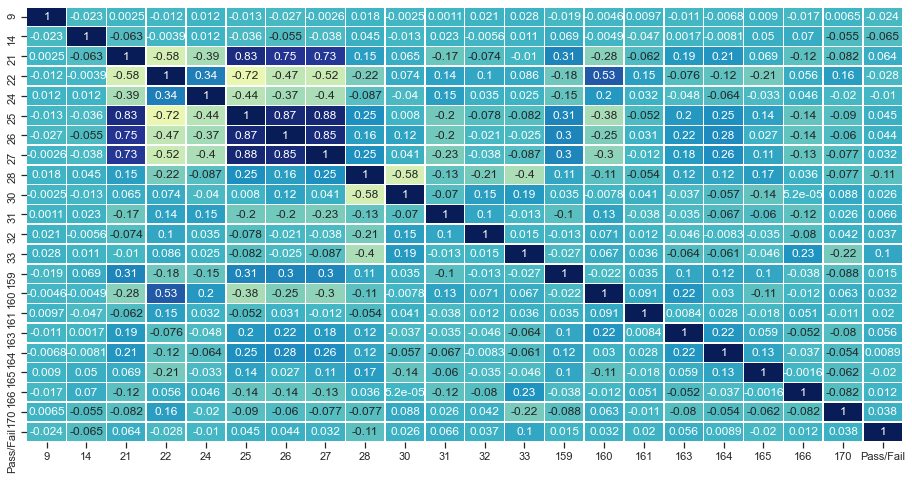

In [143]:
sns.set(rc={'figure.figsize':(15.7,8)})

sns.set(style="ticks", color_codes=True)

sns.heatmap(signal_new.corr(), annot=True, linewidths=0.5, center=0, cbar=False, cmap="YlGnBu")

In [ ]:
Observations:
    There are 2 - 3 columns which seem to be having multi-collinearity issues
    1. Column 25 & 27 with a corelation of 0.88
    2. Column 25 & 26 with a corelation of 0.87
    3. Column 26 & 27 with a corelation of 0.85
    4. Column 21 & 25 with a corelation of 0.83
    
    Other than these all other independnt variables do not have a strong linear relationship with others 

In [79]:
before_dropping_column_25 = signal_new.copy()

In [80]:
signal_new.drop(['25'], axis=1,inplace=True) 

In [81]:
signal_new.shape

(1567, 21)

<AxesSubplot:>

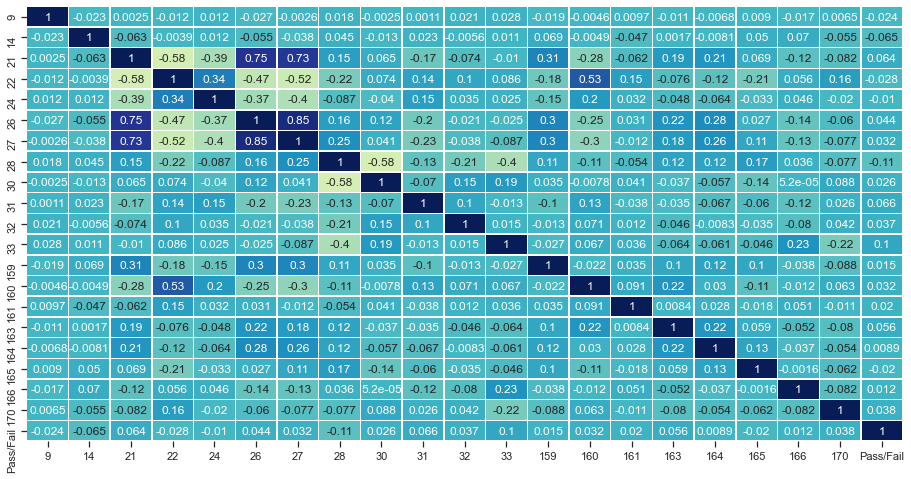

In [148]:
sns.set(rc={'figure.figsize':(15.7,8)})

sns.set(style="ticks", color_codes=True)

sns.heatmap(signal_new.corr(), annot=True, linewidths=0.5, center=0, cbar=False, cmap="YlGnBu")

In [ ]:
# we could still go ahead and drop Column 26 or 27 but lets leave them as is as the corelation is only 0.85

In [82]:
signal_new.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
9,1567.0,-0.001384,0.013846,-0.0393,-0.01065,-0.0013,0.00760,0.0362
14,1567.0,8.943571,2.693693,2.2493,7.09675,8.9739,10.79560,16.3650
21,1567.0,-5665.417382,443.409707,-6736.0000,-5873.00000,-5523.2500,-5370.62500,-4520.7500
22,1567.0,2710.890400,197.697360,2199.5000,2585.37500,2664.0000,2806.00000,3223.7500
24,1567.0,-202.348987,1857.241923,-5718.5000,-1144.00000,-80.5000,1276.87500,5385.6667
26,1567.0,1.966689,0.055041,1.7675,1.95385,1.9863,2.00320,2.0528
27,1567.0,6.731506,1.042617,2.1807,7.05535,7.2645,7.32960,7.6588
28,1567.0,69.535043,3.407205,60.1111,67.40555,69.1556,72.25555,77.9000
30,1567.0,0.184807,0.031271,0.0974,0.16265,0.1867,0.20685,0.2732
31,1567.0,3.406542,0.074917,3.1270,3.36315,3.4314,3.43935,3.7759


In [83]:
signal_new.duplicated().sum() #......... there are no duplicated data

0

# 4. Data Pre-Processing

In [84]:
from sklearn.linear_model import RidgeClassifier
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

import imblearn 
from imblearn.over_sampling import SMOTE
from scipy.stats import zscore


In [85]:
#  4A.... Segregating Predictors and Target attributes

X = signal_new.drop(["Pass/Fail"], axis=1)   #........... Independent variables / Predictors attribute, 
y = signal_new['Pass/Fail']                  #.............. Dependent variable / Target attribute

In [86]:
# 4B.... Checking for Target variable Imbalance

signal_new['Pass/Fail'].value_counts()

-1    1463
 1     104
Name: Pass/Fail, dtype: int64

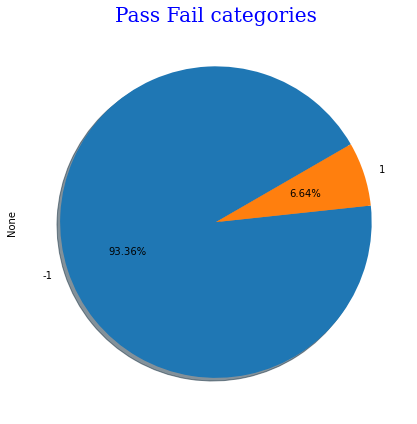

In [87]:
signal_new.groupby('Pass/Fail').size().plot(kind='pie', subplots=True, shadow=True, startangle=30, figsize=(8,6), autopct='%1.2f%%')
font1 = {'family':'serif','color':'blue','size':20}
plt.title("Pass Fail categories", fontdict = font1)    
                
plt.tight_layout()
plt.show()


In [ ]:
# ..... It is Hugely Imbalanced with (Fail: -1) - (93%) and (Pass: 1) - (6.64%)

In [88]:
oversample = SMOTE()
X, y = oversample.fit_resample(X, y)

In [89]:
unique, counts = np.unique(y, return_counts=True)

result = np.column_stack((unique, counts)) 
print (result)

[[  -1 1463]
 [   1 1463]]


In [90]:
y.value_counts()

-1    1463
 1    1463
Name: Pass/Fail, dtype: int64

In [ ]:
#   Using SMOTE() the Imbalance has been corrected........... Now Pass & Fail both are 1463

In [91]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
9,2926.0,-0.001813,0.012577,-0.0393,-0.009961,-0.001587,0.006144,0.0362
14,2926.0,8.647394,2.524923,2.2493,6.784925,8.712231,10.362700,16.3650
21,2926.0,-5609.530560,402.775606,-6736.0000,-5703.904695,-5505.285447,-5362.502129,-4520.7500
22,2926.0,2700.522194,179.181606,2199.5000,2599.969947,2660.946446,2755.344526,3223.7500
24,2926.0,-240.301305,1730.252949,-5718.5000,-1101.729175,-80.500000,833.750000,5385.6667
26,2926.0,1.971658,0.047892,1.7675,1.965716,1.986300,2.001264,2.0528
27,2926.0,6.819303,0.954980,2.1807,7.122375,7.264500,7.324249,7.6588
28,2926.0,68.795674,3.220336,60.1111,66.882250,68.711100,70.751090,77.9000
30,2926.0,0.187231,0.028341,0.0974,0.168143,0.188416,0.207977,0.2732
31,2926.0,3.415310,0.071568,3.1270,3.372185,3.429564,3.453898,3.7759


In [92]:
#  4C.... Standardizing the Data

X_scaled = X.apply(zscore)

In [93]:
X_scaled.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
9,2926.0,1.426671e-17,1.000171,-2.981198,-0.648018,0.017959,0.632742,3.023015
14,2926.0,4.852198e-16,1.000171,-2.534409,-0.737760,0.025683,0.679466,3.057094
21,2926.0,-1.244543e-17,1.000171,-2.797245,-0.234350,0.258861,0.613420,2.703656
22,2926.0,9.171387e-17,1.000171,-2.796648,-0.561271,-0.220907,0.306012,2.920597
24,2926.0,-1.754407e-16,1.000171,-3.166667,-0.497947,0.092373,0.620854,3.252085
26,2926.0,-3.392555e-15,1.000171,-4.263595,-0.124080,0.305788,0.618291,1.694563
27,2926.0,9.515438e-16,1.000171,-4.858109,0.317414,0.466264,0.528840,0.879223
28,2926.0,-1.010698e-15,1.000171,-2.697252,-0.594271,-0.026267,0.607313,2.827619
30,2926.0,-9.486981e-16,1.000171,-3.170143,-0.673615,0.041820,0.732150,3.033867
31,2926.0,6.642518e-15,1.000171,-4.029151,-0.602678,0.199201,0.539276,5.039273


In [94]:
#.... 4C......... Train Test splitting of Data......... to Train & Test

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=.20, random_state=1)

In [95]:
X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(X_train, y_train, test_size=.20, random_state=2)

#.... Splittig the Train set again into Train & Validation sets, so that Test data can be only at the last stage

In [ ]:
# 4D.... Checking if the Target data distribution is the same across splits

In [96]:
y.value_counts()

-1    1463
 1    1463
Name: Pass/Fail, dtype: int64

In [164]:
print(" 1 in y",1463/(1463+1463))
print("-1 in y",1463/(1463+1463))

 1 in y 0.5
-1 in y 0.5


In [97]:
y_train.value_counts()

 1    1177
-1    1163
Name: Pass/Fail, dtype: int64

In [166]:
print(" 1 in y_train",1177/(1177+1163))
print("-1 in y_train",1163/(1177+1163))

 1 in y_train 0.502991452991453
-1 in y_train 0.497008547008547


In [98]:
y_train_1.value_counts()   #  Training set

 1    946
-1    926
Name: Pass/Fail, dtype: int64

In [168]:
print(" 1 in y_train_1 (training set)",946/(926+946))
print("-1 in y_train_1 (training set)",926/(926+946))

 1 in y_train_1 (training set) 0.5053418803418803
-1 in y_train_1 (training set) 0.4946581196581197


In [99]:
y_test_1.value_counts()   # Validation set

-1    237
 1    231
Name: Pass/Fail, dtype: int64

In [97]:
print(" 1 in y_test_1 (validation set)",231/(237+231))
print("-1 in y_test_1 (validation set)",237/(237+231))

 1 in y_test_1 (validation set) 0.4935897435897436
-1 in y_test_1 (validation set) 0.5064102564102564


In [100]:
y_test.value_counts()    # Final Testing Set

-1    300
 1    286
Name: Pass/Fail, dtype: int64

In [99]:
print(" 1 in y_test (Testing set)",286/(300+286))
print("-1 in y_test (Testing set)",300/(300+286))

 1 in y_test (Testing set) 0.4880546075085324
-1 in y_test (Testing set) 0.5119453924914675


Training set has a Target distribution of 50.53 to 49.46 (Pass to Fail) ratio
Validation set has a Target distribution of 49.35 to 50.65 (Pass to Fail) ratio
and Finally
Testing set has a Target distribution of 48.80 to 51.20 (Pass to Fail) ratio

So fairly ok distributed

In [101]:
X_train_1

,9,14,21,22,24,26,27,28,30,31,32,33,159,160,161,163,164,165,166,170
539,-1.287294,0.178850,-1.802104,2.002377,1.016673,-1.709502,-1.775004,0.353324,0.228299,0.224861,0.422413,-1.038689,-0.801338,0.271003,-0.721408,-1.150042,-0.663889,-1.093145,0.461038,0.343919
472,0.549757,0.848451,-2.309918,1.017174,0.904965,-1.820186,-1.785687,0.612161,-0.597491,0.224861,-0.358896,-0.384651,-0.781076,0.493719,0.661295,0.113392,0.549539,-0.768800,1.875953,0.578045
2500,0.380758,0.028035,0.214252,-0.203863,0.319116,0.305788,0.466264,-1.916714,0.868481,0.777535,0.215890,0.367938,-0.119190,-0.105900,0.454279,-0.134340,-0.089107,-0.052538,0.017001,-1.215083
2898,-0.316946,1.253370,-1.024725,1.132828,0.607221,-0.972250,-0.793716,0.862158,-0.861198,-0.437465,0.280796,0.934661,-0.817404,0.023613,2.265513,-1.011481,0.177582,0.582668,2.136004,-1.090193
2614,0.274378,-0.855342,0.409861,-0.613200,0.221568,0.096744,0.337727,-2.559050,2.641526,-1.080349,0.790081,1.137251,0.083628,-1.433075,0.699849,-1.277190,0.077661,-0.240750,0.903847,-0.684137
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2519,-0.046240,0.303332,0.203933,0.783988,0.007744,0.201330,0.485780,1.018753,-0.052838,-0.817940,0.659058,-0.727520,-0.954878,0.900623,-0.488295,1.405448,1.138658,1.907142,-0.370415,1.313904
1255,-2.750572,0.464017,-0.640589,0.221756,-1.393357,1.057606,0.778890,0.636293,-0.032848,0.139613,-0.634727,0.549379,1.569295,-0.105900,-0.606530,-0.134340,0.421810,3.312543,-1.095368,-0.383425
920,0.311179,0.221195,0.285023,-0.033615,1.315669,0.664990,0.521249,1.595643,-0.816289,0.440077,1.201305,-0.883274,-0.635867,-0.465671,-0.770509,-0.530711,0.677268,0.623181,-0.670893,0.137456
2566,0.387587,0.275903,1.037916,-0.285775,-0.077485,0.548488,0.429909,0.961547,0.196755,-1.771804,-0.386881,0.061386,-0.451635,-0.220435,-0.872691,2.125915,-1.359909,-0.636821,-0.217915,0.761664


In [102]:
y_train_1

539    -1
472    -1
2500    1
2898    1
2614    1
       ..
2519    1
1255   -1
920    -1
2566    1
2829    1
Name: Pass/Fail, Length: 1872, dtype: int64

# 5. Model Training, Testing and Tuning

In [103]:
# ...5A... Train Logistic Regression model

from sklearn import metrics

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score

# Fit the model on train
model = LogisticRegression(solver="liblinear")
model.fit(X_train_1, y_train_1)
#predict on test
y_pred_logit = model.predict(X_test_1)


coef_df = pd.DataFrame(model.coef_)
coef_df['intercept'] = model.intercept_
print(coef_df)

       0         1         2         3         4         5         6  \
0  0.004 -0.207404  0.314381 -0.235287  0.031524 -0.256565  0.335968   

          7         8         9  ...        11        12        13        14  \
0 -0.493739 -0.159422  0.334373  ...  0.485035 -0.004339  0.184012  0.134599   

         15        16        17        18        19  intercept  
0  0.302211  0.043837 -0.149091  0.111192  0.395942   0.002587  

[1 rows x 21 columns]


In [104]:
model_score_train = model.score(X_train_1, y_train_1)
print(model_score_train)

0.6816239316239316


In [105]:
model_score_valid = model.score(X_test_1, y_test_1)
print(model_score_valid)

0.7051282051282052


In [106]:
print("Logistic regression - Accuracy ",metrics.accuracy_score(y_test_1, y_pred_logit))
print("Logistic regression - Precision",metrics.precision_score(y_test_1, y_pred_logit))
print("Logistic regression - Recall   ",metrics.recall_score(y_test_1, y_pred_logit))
print("Logistic regression - F1 score ",metrics.f1_score(y_test_1, y_pred_logit))
print("Logistic regression - ROC      ",metrics.roc_auc_score(y_test_1, y_pred_logit))


Logistic regression - Accuracy  0.7051282051282052
Logistic regression - Precision 0.6882591093117408
Logistic regression - Recall    0.7359307359307359
Logistic regression - F1 score  0.7112970711297071
Logistic regression - ROC       0.7055181105814016


In [ ]:
#.... Logistic Regression is giving a High Bias, Low variance score........ 

#.....Training score   -> 68.16 & 
#.....Validation score -> 70.51

In [111]:
# .... 5B..... GridsearchCV for Logistic Regression

from sklearn.model_selection import GridSearchCV

parameters = [{'penalty': ['l1'], 'solver': ['liblinear', 'saga'], 'C':[1, 10, 100]},
              {'penalty': ['l2'], 'solver': ['lbfgs','sag','newton-cg'], 'C':[1, 10, 100]}] 
              
Logreg=LogisticRegression()

grid_search = GridSearchCV(estimator = Logreg,  
                           param_grid = parameters,
                           scoring = 'accuracy',
                           cv = 5,
                           verbose=0)

grid_search.fit(X_train_1, y_train_1)  

def display1(results):
    print(f'Best parameters are: {results.best_params_}')
    print("")
    mean_score = results.cv_results_['mean_test_score']
    std_score = results.cv_results_['std_test_score']
    params = results.cv_results_['params']
    for mean,std,params in zip(mean_score,std_score,params):
        print(f'{round(mean,2)} + or -{round(std,2)} for the {params}')

display1(grid_search)

Best parameters are: {'C': 1, 'penalty': 'l1', 'solver': 'saga'}

0.67 + or -0.02 for the {'C': 1, 'penalty': 'l1', 'solver': 'liblinear'}
0.67 + or -0.03 for the {'C': 1, 'penalty': 'l1', 'solver': 'saga'}
0.67 + or -0.02 for the {'C': 10, 'penalty': 'l1', 'solver': 'liblinear'}
0.67 + or -0.02 for the {'C': 10, 'penalty': 'l1', 'solver': 'saga'}
0.67 + or -0.02 for the {'C': 100, 'penalty': 'l1', 'solver': 'liblinear'}
0.67 + or -0.02 for the {'C': 100, 'penalty': 'l1', 'solver': 'saga'}
0.67 + or -0.02 for the {'C': 1, 'penalty': 'l2', 'solver': 'lbfgs'}
0.67 + or -0.02 for the {'C': 1, 'penalty': 'l2', 'solver': 'sag'}
0.67 + or -0.02 for the {'C': 1, 'penalty': 'l2', 'solver': 'newton-cg'}
0.67 + or -0.02 for the {'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}
0.67 + or -0.02 for the {'C': 10, 'penalty': 'l2', 'solver': 'sag'}
0.67 + or -0.02 for the {'C': 10, 'penalty': 'l2', 'solver': 'newton-cg'}
0.67 + or -0.02 for the {'C': 100, 'penalty': 'l2', 'solver': 'lbfgs'}
0.67 + or -0.

0.6832264957264957

Logistic regression - Accuracy  0.7072649572649573
Logistic regression - Precision 0.6910569105691057
Logistic regression - Recall    0.7359307359307359
Logistic regression - F1 score  0.7127882599580712
Logistic regression - ROC       0.7076278152227519


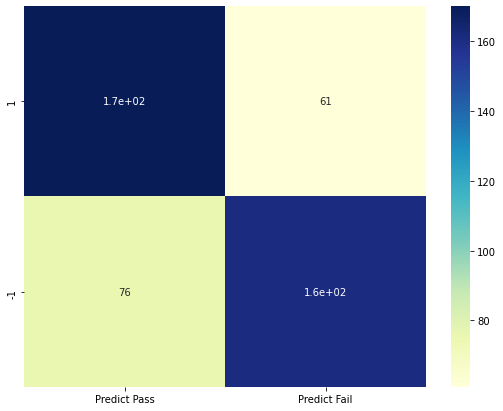

In [112]:
# 5C...... Hyper tuned Logistic regression based on Gridsearch 

model = LogisticRegression(solver="saga", penalty="l1", C=1, random_state=10)
model.fit(X_train_1, y_train_1)
#predict on test
y_pred_logit = model.predict(X_test_1)

model_score_train = model.score(X_train_1, y_train_1)
print(model_score_train)
print("")

cm=metrics.confusion_matrix(y_test_1, y_pred_logit, labels=[1,-1])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","-1"]],
                  columns = [i for i in ["Predict Pass","Predict Fail"]])
plt.figure(figsize = (9,7))
sns.heatmap(df_cm, annot=True,cmap="YlGnBu")

print("Logistic regression - Accuracy ",metrics.accuracy_score(y_test_1, y_pred_logit))
print("Logistic regression - Precision",metrics.precision_score(y_test_1, y_pred_logit))
print("Logistic regression - Recall   ",metrics.recall_score(y_test_1, y_pred_logit))
print("Logistic regression - F1 score ",metrics.f1_score(y_test_1, y_pred_logit))
print("Logistic regression - ROC      ",metrics.roc_auc_score(y_test_1, y_pred_logit))


In [ ]:
Best score by hyper tuned Logistic Regression gives us

Logistic regression - Accuracy  0.7072649572649573
Logistic regression - Precision 0.6910569105691057
Logistic regression - Recall    0.7359307359307359
Logistic regression - F1 score  0.7127882599580712
Logistic regression - ROC       0.7076278152227519

In [113]:
from sklearn.neighbors import KNeighborsClassifier # Training the model with KNN classifier
import scipy.stats as stats

from sklearn.metrics import roc_auc_score

# ... Training base model for KNN

NNH = KNeighborsClassifier(n_neighbors= 5, weights = 'distance' )
NNH.fit(X_train_1, y_train_1)

#Predict testing set
y_pred_knn = NNH.predict(X_test_1)
#Check performance using accuracy

print("KNN - Accuracy ",metrics.accuracy_score(y_test_1, y_pred_knn))
print("KNN - Precision",metrics.precision_score(y_test_1, y_pred_knn))
print("KNN - Recall   ",metrics.recall_score(y_test_1, y_pred_knn))
print("KNN - F1 score ",metrics.f1_score(y_test_1, y_pred_knn))
print("KNN - ROC      ",metrics.roc_auc_score(y_test_1, y_pred_knn))


KNN - Accuracy  0.782051282051282
KNN - Precision 0.6936936936936937
KNN - Recall    1.0
KNN - F1 score  0.8191489361702128
KNN - ROC       0.7848101265822784


In [114]:
print("KNN Training score",NNH.score(X_train_1,y_train_1))
print("KNN Validation score",NNH.score(X_test_1,y_test_1))


KNN Training score 1.0
KNN Validation score 0.782051282051282


In [ ]:
# with KNN the Training score went up to 1 and No bias but the validation score is 0.80 so heavily high variance

[0.802343838889521, 0.7660257139606327, 0.7468170440323132, 0.7339941972920696, 0.7227670952326772, 0.7120832859255888, 0.6992547502560018, 0.6901865968824668, 0.6779013539651838, 0.6688132893389463, 0.6688104448742747, 0.6629309363977699, 0.6629337808624417, 0.6575918762088976, 0.6559762202753443]


Text(0, 0.5, 'Cross-Validated Accuracy')

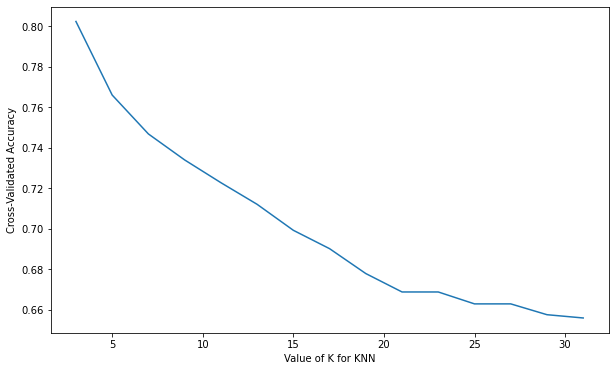

In [115]:
#...5B... Cross Validation for KNN

from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_score

# search for an optimal value of K for KNN

# list of integers 3 to 31

k_range = range(3, 32, 2)

# list of scores from k_range
k_scores = []

# Looping through reasonable values of k
for k in k_range:
    # 2. run KNeighborsClassifier with k neighbours
    knn = KNeighborsClassifier(n_neighbors=k)
    # 3. obtain cross_val_score for KNeighborsClassifier with k neighbours
    scores = cross_val_score(knn, X_train_1, y_train_1, cv=10, scoring='accuracy')
    # 4. append mean of scores for k neighbors to k_scores list
    k_scores.append(scores.mean())
print(k_scores)

# plot the value of K for KNN (x-axis) versus the cross-validated accuracy (y-axis)

plt.figure(figsize = (10,6))
plt.plot(k_range, k_scores)
plt.xlabel('Value of K for KNN')
plt.ylabel('Cross-Validated Accuracy')

In [116]:
from sklearn.model_selection import GridSearchCV

#List Hyperparameters to tune
leaf_size = list(range(1,10))
n_neighbors = list(range(3,32,2))
p=[1,2]
#convert to dictionary
hyperparameters = dict(leaf_size=leaf_size, n_neighbors=n_neighbors, p=p)
#Making model
clf = GridSearchCV(knn, hyperparameters, cv=10)
best_model = clf.fit(X_train_1,y_train_1)

#Best Hyperparameters Value
print('Best leaf_size:', best_model.best_estimator_.get_params()['leaf_size'])
print('Best p:', best_model.best_estimator_.get_params()['p'])
print('Best n_neighbors:', best_model.best_estimator_.get_params()['n_neighbors'])
print("")
#Predict testing set
y_pred_grid_knn = best_model.predict(X_test_1)

print("GridSearchCV for KNN - Accuracy ",metrics.accuracy_score(y_test_1, y_pred_grid_knn))
print("GridSearchCV for KNN - Precision",metrics.precision_score(y_test_1, y_pred_grid_knn))
print("GridSearchCV for KNN - Recall   ",metrics.recall_score(y_test_1, y_pred_grid_knn))
print("GridSearchCV for KNN - F1 score ",metrics.f1_score(y_test_1, y_pred_grid_knn))

Best leaf_size: 1
Best p: 1
Best n_neighbors: 3

GridSearchCV for KNN - Accuracy  0.8183760683760684
GridSearchCV for KNN - Precision 0.7310126582278481
GridSearchCV for KNN - Recall    1.0
GridSearchCV for KNN - F1 score  0.8446069469835467


With neighbours 3, leaf = 1, p=1 - Accuracy  0.8183760683760684
With neighbours 3, leaf = 1, p=1 - Precision 0.7310126582278481
With neighbours 3, leaf = 1, p=1 - Recall    1.0
With neighbours 3, leaf = 1, p=1 - F1 score  0.8446069469835467


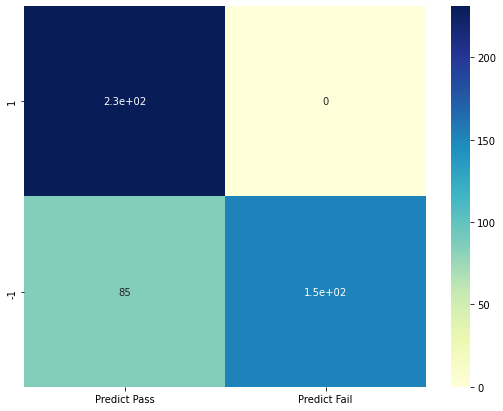

In [117]:
knn = KNeighborsClassifier(n_neighbors= 3, weights = 'distance',leaf_size=1,p=1)

#Training the model
knn.fit(X_train_1, y_train_1)
#Predict testing set
y_pred_knn_tune_1 = knn.predict(X_test_1)

cm=metrics.confusion_matrix(y_test_1, y_pred_knn_tune_1, labels=[1,-1])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","-1"]],
                  columns = [i for i in ["Predict Pass","Predict Fail"]])
plt.figure(figsize = (9,7))
sns.heatmap(df_cm, annot=True,cmap="YlGnBu")

print("With neighbours 3, leaf = 1, p=1 - Accuracy ",metrics.accuracy_score(y_test_1, y_pred_knn_tune_1))
print("With neighbours 3, leaf = 1, p=1 - Precision",metrics.precision_score(y_test_1, y_pred_knn_tune_1))
print("With neighbours 3, leaf = 1, p=1 - Recall   ",metrics.recall_score(y_test_1, y_pred_knn_tune_1))
print("With neighbours 3, leaf = 1, p=1 - F1 score ",metrics.f1_score(y_test_1, y_pred_knn_tune_1))


In [118]:
knn = KNeighborsClassifier(n_neighbors= 3, weights = 'uniform',leaf_size=1,p=1)

#Training the model
knn.fit(X_train_1, y_train_1)
#Predict testing set
y_pred_knn_tune_2 = knn.predict(X_test_1)

print("With neighbours 3, leaf = 1, p=1 - Accuracy ",metrics.accuracy_score(y_test_1, y_pred_knn_tune_2))
print("With neighbours 3, leaf = 1, p=1 - Precision",metrics.precision_score(y_test_1, y_pred_knn_tune_2))
print("With neighbours 3, leaf = 1, p=1 - Recall   ",metrics.recall_score(y_test_1, y_pred_knn_tune_2))
print("With neighbours 3, leaf = 1, p=1 - F1 score ",metrics.f1_score(y_test_1, y_pred_knn_tune_2))


With neighbours 3, leaf = 1, p=1 - Accuracy  0.8183760683760684
With neighbours 3, leaf = 1, p=1 - Precision 0.7310126582278481
With neighbours 3, leaf = 1, p=1 - Recall    1.0
With neighbours 3, leaf = 1, p=1 - F1 score  0.8446069469835467


In [ ]:
# Best KNN Tuned model gave us 

# With neighbours 3, leaf = 1, p=1 - Accuracy  0.8183760683760684
# With neighbours 3, leaf = 1, p=1 - Precision 0.7310126582278481
# With neighbours 3, leaf = 1, p=1 - Recall    1.0
# With neighbours 3, leaf = 1, p=1 - F1 score  0.8446069469835467

In [119]:
from sklearn.svm import SVC   # Training the model with Support Vector Classifier

clf = SVC(kernel='linear') 
  
# fitting x samples and y classes 
clf.fit(X_train_1, y_train_1) 

y_pred_svc = clf.predict(X_test_1)

print("SVC - Accuracy ",metrics.accuracy_score(y_test_1, y_pred_svc))
print("SVC - Precision",metrics.precision_score(y_test_1, y_pred_svc))
print("SVC - Recall   ",metrics.recall_score(y_test_1, y_pred_svc))
print("SVC - F1 Score ",metrics.f1_score(y_test_1, y_pred_svc))
print("SVC - ROC Score",metrics.roc_auc_score(y_test_1, y_pred_svc))


SVC - Accuracy  0.7115384615384616
SVC - Precision 0.683206106870229
SVC - Recall    0.7748917748917749
SVC - F1 Score  0.7261663286004056
SVC - ROC Score 0.71234040221382


In [120]:
svc= SVC()
parameters = [{"kernel": ["rbf"],"gamma":[0.1,0.01],"C":[0.1,1,10]},
              {"kernel": ["linear"],"C": [0.1,1,10]}]

cv = GridSearchCV(svc,parameters,cv=5)
cv.fit(X_train_1, y_train_1) 

display1(cv)

Best parameters are: {'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}

0.82 + or -0.01 for the {'C': 0.1, 'gamma': 0.1, 'kernel': 'rbf'}
0.72 + or -0.02 for the {'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
0.96 + or -0.0 for the {'C': 1, 'gamma': 0.1, 'kernel': 'rbf'}
0.8 + or -0.01 for the {'C': 1, 'gamma': 0.01, 'kernel': 'rbf'}
0.97 + or -0.0 for the {'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}
0.88 + or -0.01 for the {'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}
0.69 + or -0.01 for the {'C': 0.1, 'kernel': 'linear'}
0.68 + or -0.01 for the {'C': 1, 'kernel': 'linear'}
0.68 + or -0.01 for the {'C': 10, 'kernel': 'linear'}


SVC - Accuracy  0.9636752136752137
SVC - Precision 0.9385245901639344
SVC - Recall    0.9913419913419913
SVC - F1 Score  0.9642105263157894
SVC - ROC Score 0.9640254260507426


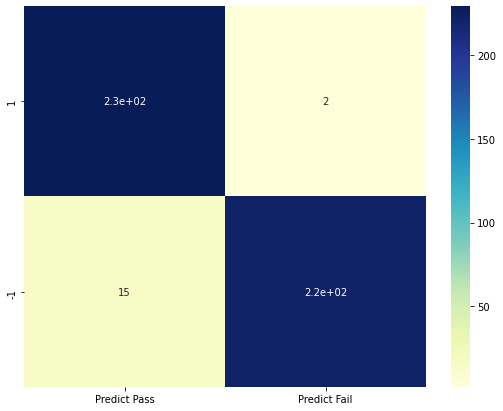

In [121]:
# Hyper tuned SVC model with GradientSearch recommended parameters

clf = SVC(kernel='rbf',C = 10.0,gamma=0.1) 
  
# fitting x samples and y classes 
clf.fit(X_train_1, y_train_1) 

y_pred_svc_1 = clf.predict(X_test_1)

cm=metrics.confusion_matrix(y_test_1, y_pred_svc_1, labels=[1,-1])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","-1"]],
                  columns = [i for i in ["Predict Pass","Predict Fail"]])
plt.figure(figsize = (9,7))
sns.heatmap(df_cm, annot=True,cmap="YlGnBu")

print("SVC - Accuracy ",metrics.accuracy_score(y_test_1, y_pred_svc_1))
print("SVC - Precision",metrics.precision_score(y_test_1, y_pred_svc_1))
print("SVC - Recall   ",metrics.recall_score(y_test_1, y_pred_svc_1))
print("SVC - F1 Score ",metrics.f1_score(y_test_1, y_pred_svc_1))
print("SVC - ROC Score",metrics.roc_auc_score(y_test_1, y_pred_svc_1))


In [ ]:
So hyper tuned SVC gives us the below scores which is better than the KNN hyper tuned scores

SVC - Accuracy  0.9636752136752137
SVC - Precision 0.9385245901639344
SVC - Recall    0.9913419913419913
SVC - F1 Score  0.9642105263157894
SVC - ROC Score 0.9640254260507426

Decision tree Training score 1.0
Decision tree Validation score 0.844017094017094

Decision Tree - Accuracy  0.844017094017094
Decision Tree - Precision 0.7992424242424242
Decision Tree - Recall    0.9134199134199135
Decision Tree - F1 score  0.8525252525252526
Decision Tree - ROC       0.8448956107183957


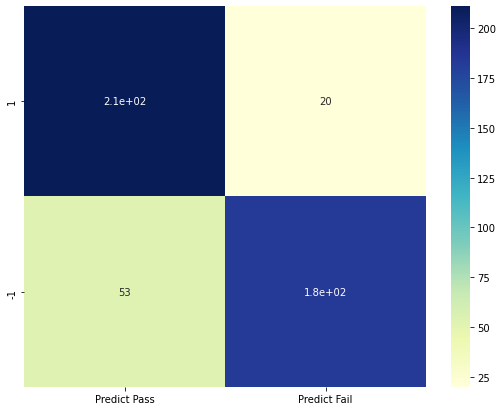

In [122]:
from sklearn.tree import DecisionTreeClassifier  # trying with Decision tree classifier

dt_model = DecisionTreeClassifier(criterion = 'gini', random_state=1)
dt_model.fit(X_train_1, y_train_1)

print("Decision tree Training score",dt_model.score(X_train_1, y_train_1))
print("Decision tree Validation score",dt_model.score(X_test_1, y_test_1))
print("")

y_pred_dt = dt_model.predict(X_test_1)

cm=metrics.confusion_matrix(y_test_1, y_pred_dt, labels=[1,-1])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","-1"]],
                  columns = [i for i in ["Predict Pass","Predict Fail"]])
plt.figure(figsize = (9,7))
sns.heatmap(df_cm, annot=True,cmap="YlGnBu")

print("Decision Tree - Accuracy ",metrics.accuracy_score(y_test_1, y_pred_dt))
print("Decision Tree - Precision",metrics.precision_score(y_test_1, y_pred_dt))
print("Decision Tree - Recall   ",metrics.recall_score(y_test_1, y_pred_dt))
print("Decision Tree - F1 score ",metrics.f1_score(y_test_1, y_pred_dt))
print("Decision Tree - ROC      ",metrics.roc_auc_score(y_test_1, y_pred_dt))


In [123]:
from sklearn.tree import export_graphviz

train_char_label = ["-1", "1"]
Credit_Tree_File = open('signal_credit_tree.dot','w')
dot_data = export_graphviz(dt_model, out_file=Credit_Tree_File, feature_names = list(X_train_1), class_names = list(train_char_label))
Credit_Tree_File.close()

In [124]:
from os import system
from IPython.display import Image

retCode = system("dot -Tpng signal_credit_tree.dot -o signal_credit_tree.png")
if(retCode>0):
    print("system command returning error: "+str(retCode))
else:
    display(Image("signal_credit_tree.png"))

In [125]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification

clf = RandomForestClassifier(max_depth=4, n_estimators=100, random_state=0, )
clf.fit(X_train_1, y_train_1)

print("Random forest Training score",clf.score(X_train_1, y_train_1))
print("Random forest Validation score",clf.score(X_test_1, y_test_1))
print("")

y_pred_rf = clf.predict(X_test_1)

print("Random forest - Accuracy ",metrics.accuracy_score(y_test_1, y_pred_rf))
print("Random forest - Precision",metrics.precision_score(y_test_1, y_pred_rf))
print("Random forest - Recall   ",metrics.recall_score(y_test_1, y_pred_rf))
print("Random forest - F1 score ",metrics.f1_score(y_test_1, y_pred_rf))
print("Random forest - ROC      ",metrics.roc_auc_score(y_test_1, y_pred_rf))

Random forest Training score 0.8258547008547008
Random forest Validation score 0.8141025641025641

Random forest - Accuracy  0.8141025641025641
Random forest - Precision 0.7589928057553957
Random forest - Recall    0.9134199134199135
Random forest - F1 score  0.8290766208251475
Random forest - ROC       0.8153597457394927


In [126]:
rfc = RandomForestClassifier(n_jobs=-1,max_features= 'sqrt' ,n_estimators=50, oob_score = True) 

param_grid = { 
    'n_estimators': [100,150,200,250],
       'max_depth': [3,4,5],
    'max_features': ['auto', 'sqrt', 'log2']
}

CV_rfc = GridSearchCV(estimator=rfc, param_grid=param_grid, cv= 5)
CV_rfc.fit(X_train_1, y_train_1)

display1(CV_rfc)

Best parameters are: {'max_depth': 5, 'max_features': 'sqrt', 'n_estimators': 250}

0.73 + or -0.03 for the {'max_depth': 3, 'max_features': 'auto', 'n_estimators': 100}
0.75 + or -0.03 for the {'max_depth': 3, 'max_features': 'auto', 'n_estimators': 150}
0.74 + or -0.03 for the {'max_depth': 3, 'max_features': 'auto', 'n_estimators': 200}
0.74 + or -0.03 for the {'max_depth': 3, 'max_features': 'auto', 'n_estimators': 250}
0.75 + or -0.04 for the {'max_depth': 3, 'max_features': 'sqrt', 'n_estimators': 100}
0.74 + or -0.03 for the {'max_depth': 3, 'max_features': 'sqrt', 'n_estimators': 150}
0.74 + or -0.03 for the {'max_depth': 3, 'max_features': 'sqrt', 'n_estimators': 200}
0.74 + or -0.03 for the {'max_depth': 3, 'max_features': 'sqrt', 'n_estimators': 250}
0.75 + or -0.03 for the {'max_depth': 3, 'max_features': 'log2', 'n_estimators': 100}
0.74 + or -0.03 for the {'max_depth': 3, 'max_features': 'log2', 'n_estimators': 150}
0.74 + or -0.03 for the {'max_depth': 3, 'max_features':

Random forest Training score 0.8733974358974359
Random forest Validation score 0.8397435897435898

Random forest - Accuracy  0.8397435897435898
Random forest - Precision 0.7785714285714286
Random forest - Recall    0.9437229437229437
Random forest - F1 score  0.853228962818004
Random forest - ROC       0.8410597840977587



33     0.155493
28     0.123071
160    0.114828
32     0.074430
21     0.059026
27     0.052177
163    0.045694
31     0.040704
26     0.039270
22     0.037183
165    0.034084
161    0.032821
30     0.032699
24     0.027037
14     0.025671
170    0.023438
159    0.022588
164    0.022017
9      0.019855
166    0.017915
dtype: float64

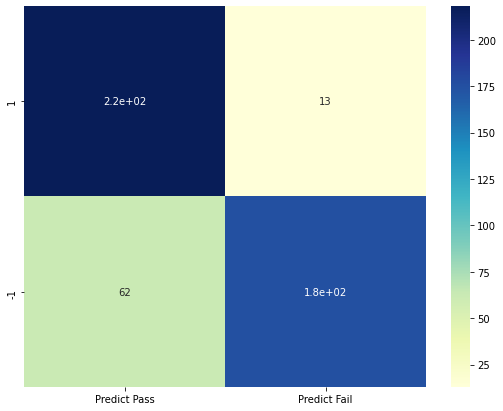

In [127]:
# Hyper parameter tuned Random Forest classifier based on the GridSearchCV Best params

clf = RandomForestClassifier(max_depth=5, max_features= 'sqrt', n_estimators=250, random_state=0, )

clf.fit(X_train_1, y_train_1)

print("Random forest Training score",clf.score(X_train_1, y_train_1))
print("Random forest Validation score",clf.score(X_test_1, y_test_1))
print("")

y_pred_rf = clf.predict(X_test_1)

cm=metrics.confusion_matrix(y_test_1, y_pred_rf, labels=[1,-1])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","-1"]],
                  columns = [i for i in ["Predict Pass","Predict Fail"]])
plt.figure(figsize = (9,7))
sns.heatmap(df_cm, annot=True,cmap="YlGnBu")

print("Random forest - Accuracy ",metrics.accuracy_score(y_test_1, y_pred_rf))
print("Random forest - Precision",metrics.precision_score(y_test_1, y_pred_rf))
print("Random forest - Recall   ",metrics.recall_score(y_test_1, y_pred_rf))
print("Random forest - F1 score ",metrics.f1_score(y_test_1, y_pred_rf))
print("Random forest - ROC      ",metrics.roc_auc_score(y_test_1, y_pred_rf))
print("")

feature_imp = pd.Series(clf.feature_importances_,index=X_train_1.columns).sort_values(ascending=False)

feature_imp


In [ ]:
Best hyper tuned Random Forest classifier results

Random forest - Accuracy  0.8397435897435898
Random forest - Precision 0.7785714285714286
Random forest - Recall    0.9437229437229437
Random forest - F1 score  0.853228962818004
Random forest - ROC       0.8410597840977587


In [128]:
from sklearn.ensemble import GradientBoostingClassifier

gbcl = GradientBoostingClassifier(n_estimators = 100, learning_rate = 0.08, random_state=1)
gbcl = gbcl.fit(X_train_1, y_train_1)

print("Gradient Boost Training score",gbcl.score(X_train_1,y_train_1))
print("Gradient Boost Validation score",gbcl.score(X_test_1,y_test_1))
print("")

y_pred_gbc = gbcl.predict(X_test_1)

print("Trees - 125, rate=0.08 XGB - Accuracy ",metrics.accuracy_score(y_test_1, y_pred_gbc))
print("Trees - 125, rate=0.08 XGB - Precision",metrics.precision_score(y_test_1, y_pred_gbc))
print("Trees - 125, rate=0.08 XGB - Recall   ",metrics.recall_score(y_test_1, y_pred_gbc))
print("Trees - 125, rate=0.08 XGB - F1 score ",metrics.f1_score(y_test_1, y_pred_gbc))
print("Trees - 125, rate=0.08 XGB - ROC      ",metrics.roc_auc_score(y_test_1, y_pred_gbc))
print("")

feature_importances = pd.DataFrame(gbcl.feature_importances_,
                                   index = X_train_1.columns,
                                    columns=['importance']).sort_values('importance', ascending=False)

feature_importances

Gradient Boost Training score 0.9508547008547008
Gradient Boost Validation score 0.9081196581196581

Trees - 125, rate=0.08 XGB - Accuracy  0.9081196581196581
Trees - 125, rate=0.08 XGB - Precision 0.8671875
Trees - 125, rate=0.08 XGB - Recall    0.961038961038961
Trees - 125, rate=0.08 XGB - F1 score  0.9117043121149897
Trees - 125, rate=0.08 XGB - ROC       0.9087895227135734



,importance
33,0.150559
32,0.104397
160,0.087797
28,0.071265
27,0.068667
14,0.054545
161,0.047982
21,0.044552
163,0.043930
165,0.038347


In [129]:
# Gridsearch for GradientBoosting Classifier

parameters = {
    "learning_rate": [0.025, 0.05, 0.075],    
    "max_depth":[3,5,8],
    "max_features":["log2","sqrt"],       
    "n_estimators":[100,125,150]
    }

clf = GridSearchCV(GradientBoostingClassifier(), parameters, cv=5, n_jobs=-1)

clf.fit(X_train_1, y_train_1)

display1(clf)

Best parameters are: {'learning_rate': 0.075, 'max_depth': 8, 'max_features': 'sqrt', 'n_estimators': 150}

0.8 + or -0.02 for the {'learning_rate': 0.025, 'max_depth': 3, 'max_features': 'log2', 'n_estimators': 100}
0.81 + or -0.02 for the {'learning_rate': 0.025, 'max_depth': 3, 'max_features': 'log2', 'n_estimators': 125}
0.82 + or -0.01 for the {'learning_rate': 0.025, 'max_depth': 3, 'max_features': 'log2', 'n_estimators': 150}
0.8 + or -0.02 for the {'learning_rate': 0.025, 'max_depth': 3, 'max_features': 'sqrt', 'n_estimators': 100}
0.81 + or -0.02 for the {'learning_rate': 0.025, 'max_depth': 3, 'max_features': 'sqrt', 'n_estimators': 125}
0.82 + or -0.01 for the {'learning_rate': 0.025, 'max_depth': 3, 'max_features': 'sqrt', 'n_estimators': 150}
0.87 + or -0.01 for the {'learning_rate': 0.025, 'max_depth': 5, 'max_features': 'log2', 'n_estimators': 100}
0.89 + or -0.01 for the {'learning_rate': 0.025, 'max_depth': 5, 'max_features': 'log2', 'n_estimators': 125}
0.89 + or -0.0

Gradient Boost Training score 1.0
Gradient Boost Validation score 0.9658119658119658

XGB - Accuracy  0.9658119658119658
XGB - Precision 0.946058091286307
XGB - Recall    0.987012987012987
XGB - F1 score  0.9661016949152542
XGB - ROC       0.9660803331689407



,importance
33,0.116583
160,0.075453
32,0.070108
28,0.061938
27,0.056698
21,0.055310
165,0.051364
161,0.050129
31,0.049556
163,0.047814


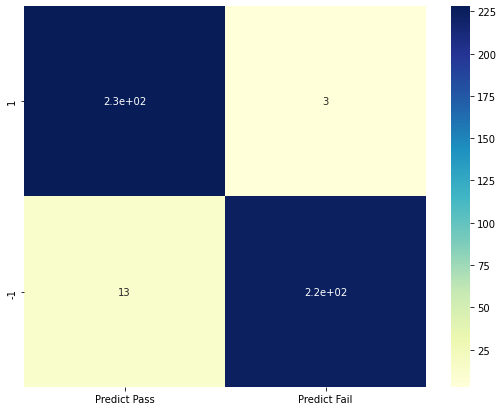

In [130]:
# Hyper tuned Gradient boost model with Gradientsearch recommended parameters

gbcl = GradientBoostingClassifier(n_estimators = 150, learning_rate = 0.075, max_depth = 8, max_features='sqrt',random_state=1)
gbcl = gbcl.fit(X_train_1, y_train_1)

print("Gradient Boost Training score",gbcl.score(X_train_1,y_train_1))
print("Gradient Boost Validation score",gbcl.score(X_test_1,y_test_1))
print("")

y_pred_gbc = gbcl.predict(X_test_1)

cm=metrics.confusion_matrix(y_test_1, y_pred_gbc, labels=[1,-1])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","-1"]],
                  columns = [i for i in ["Predict Pass","Predict Fail"]])
plt.figure(figsize = (9,7))
sns.heatmap(df_cm, annot=True,cmap="YlGnBu")

print("XGB - Accuracy ",metrics.accuracy_score(y_test_1, y_pred_gbc))
print("XGB - Precision",metrics.precision_score(y_test_1, y_pred_gbc))
print("XGB - Recall   ",metrics.recall_score(y_test_1, y_pred_gbc))
print("XGB - F1 score ",metrics.f1_score(y_test_1, y_pred_gbc))
print("XGB - ROC      ",metrics.roc_auc_score(y_test_1, y_pred_gbc))
print("")

feature_importances = pd.DataFrame(gbcl.feature_importances_,
                                   index = X_train_1.columns,
                                    columns=['importance']).sort_values('importance', ascending=False)

feature_importances

In [ ]:
Best scores by different models

1) Logistic Regression

Logistic reg - Accuracy  0.7072649572649573
Logistic reg - Precision 0.6910569105691057
Logistic reg - Recall    0.7359307359307359
Logistic reg - F1 score  0.7127882599580712
Logistic reg - ROC       0.7076278152227519

2) KNN Classifier

KNN - Accuracy  0.8183760683760684
KNN - Precision 0.7310126582278481
KNN - Recall    1.0
KNN - F1 score  0.8446069469835467

3) Support Vector Classifier

SVC - Accuracy  0.9636752136752137
SVC - Precision 0.9385245901639344
SVC - Recall    0.9913419913419913
SVC - F1 Score  0.9642105263157894
SVC - ROC Score 0.9640254260507426

4) Decision Tree Classifier

Decision Tree - Accuracy  0.844017094017094
Decision Tree - Precision 0.7992424242424242
Decision Tree - Recall    0.9134199134199135
Decision Tree - F1 score  0.8525252525252526
Decision Tree - ROC       0.8448956107183957
                
5) Random Forest Classifier

Random forest - Accuracy  0.8397435897435898
Random forest - Precision 0.7785714285714286
Random forest - Recall    0.9437229437229437
Random forest - F1 score  0.853228962818004
Random forest - ROC       0.8410597840977587

6) Gradient Boosting Classifier

XGB - Accuracy  0.9658119658119658
XGB - Precision 0.946058091286307
XGB - Recall    0.987012987012987
XGB - F1 score  0.9661016949152542
XGB - ROC       0.9660803331689407

In [131]:
signal_new.shape

(1567, 21)

In [ ]:
Checking if applying PCA can give better scores

In [132]:
#..... 5D....... Applying PCA with 10 components.

from sklearn.decomposition import PCA

# NOTE - we are generating only 10 PCA dimensions (dimensionality reduction from 21 to 10)

pca = PCA(n_components=10)
pca.fit(X_scaled)

print(pca.explained_variance_)
pca.components_
print(pca.explained_variance_ratio_)
Xpca10 = pca.transform(X_scaled)
Xpca10

[3.81010358 1.87980369 1.60136309 1.45005445 1.13147444 1.07575361
 1.056135   1.0357114  0.92034956 0.84343009]
[0.19044007 0.09395806 0.08004079 0.07247794 0.05655439 0.0537693
 0.0527887  0.05176787 0.04600175 0.04215709]


array([[ 5.10959337, -0.37063394, -0.54970581, ...,  1.36758324,
        -0.18003857,  3.14435043],
       [-1.74973135, -0.85971785, -1.57679441, ..., -0.7466265 ,
        -0.991186  ,  0.42735522],
       [-0.89079993, -0.15918733, -3.90784205, ...,  1.2708884 ,
         0.91259866,  0.96403368],
       ...,
       [-0.56967905,  0.45723667,  1.57268983, ..., -1.10730562,
         0.90922966,  0.28030861],
       [-0.62446718, -1.37638636, -0.35543506, ..., -0.43283205,
        -0.23613982, -0.80718334],
       [-0.39587761, -1.07054554, -2.11242295, ..., -0.2727404 ,
         0.24643756, -0.22022194]])

In [186]:
print('Variance of each component:', (pca.explained_variance_ratio_)*100)
print('\n Total Variance Explained:', round(sum(list(pca.explained_variance_ratio_))*100, 2))

Variance of each component: [19.04400713  9.39580621  8.00407899  7.24779439  5.65543873  5.3769298
  5.27887025  5.17678718  4.60017507  4.21570919]

 Total Variance Explained: 74.0


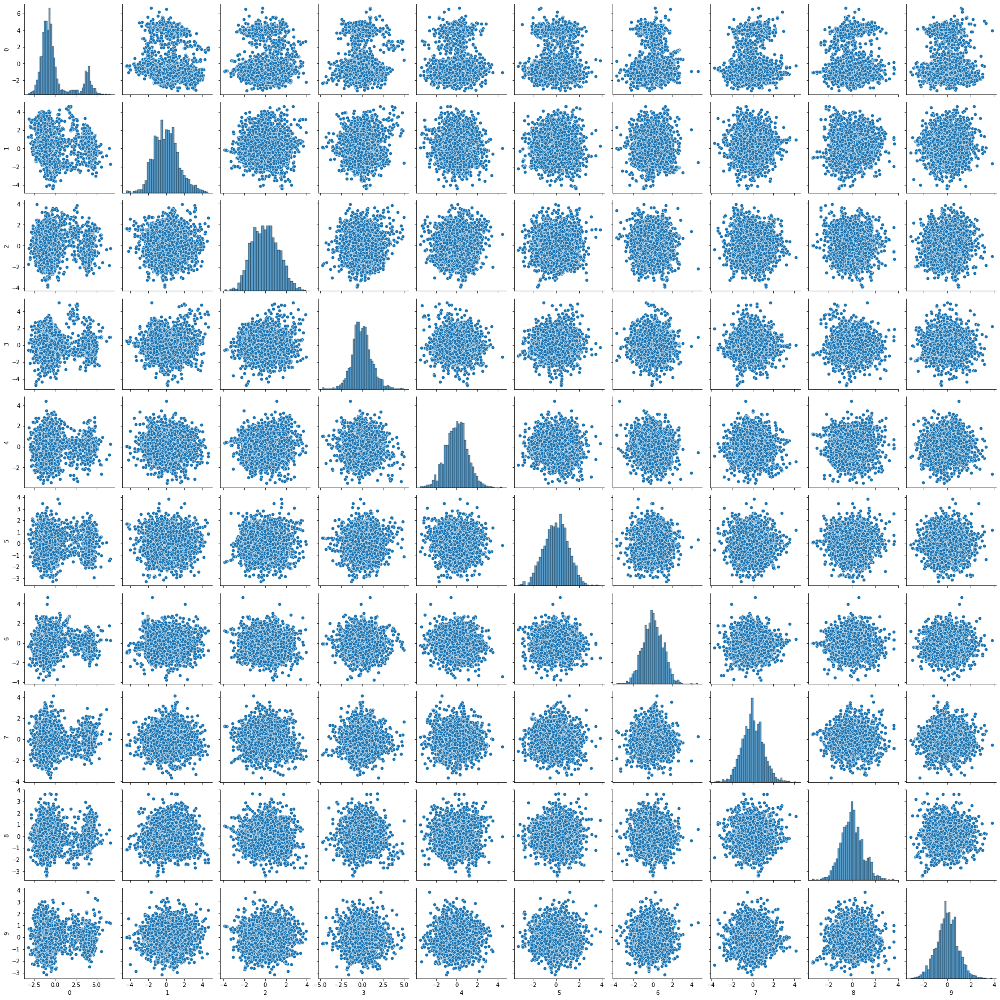

In [133]:
sns.pairplot(pd.DataFrame(Xpca10))

In [134]:
#.... 4C......... Train Test splitting of Data......... to Train & Test

X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(Xpca10, y, test_size=.20, random_state=5)
X_train_21, X_test_21, y_train_21, y_test_21 = train_test_split(X_train_2, y_train_2, test_size=.20, random_state=7)

#.... Splittig the Train set again into Train & Validation sets, so that Test data can be only at the last stage

In [135]:
y_train_2.value_counts()

 1    1171
-1    1169
Name: Pass/Fail, dtype: int64

In [136]:
y_test_2.value_counts()   #......... Final Test dataset which is a representation of Production dataset

-1    294
 1    292
Name: Pass/Fail, dtype: int64

In [137]:
y_train_21.value_counts()  #........ Training dataset 

 1    938
-1    934
Name: Pass/Fail, dtype: int64

In [138]:
y_test_21.value_counts()   #....... Validation dataset

-1    235
 1    233
Name: Pass/Fail, dtype: int64

In [139]:
#  Training the Logistic Regression model with PCA

model_pca_lr = LogisticRegression(solver="liblinear")
model_pca_lr.fit(X_train_21, y_train_21)
#predict on test
y_pred_logit_pca = model_pca_lr.predict(X_test_21)

model_score_train_pca = model_pca_lr.score(X_train_21, y_train_21)
print(model_score_train_pca)

model_score_valid_pca = model_pca_lr.score(X_test_21, y_test_21)
print(model_score_valid_pca)

print("Logistic regression PCA - Accuracy ",metrics.accuracy_score(y_test_21, y_pred_logit_pca))
print("Logistic regression PCA - Precision",metrics.precision_score(y_test_21, y_pred_logit_pca))
print("Logistic regression PCA - Recall   ",metrics.recall_score(y_test_21, y_pred_logit_pca))
print("Logistic regression PCA - F1 score ",metrics.f1_score(y_test_21, y_pred_logit_pca))
print("Logistic regression PCA - ROC      ",metrics.roc_auc_score(y_test_21, y_pred_logit_pca))



0.6490384615384616
0.6324786324786325
Logistic regression PCA - Accuracy  0.6324786324786325
Logistic regression PCA - Precision 0.6150943396226415
Logistic regression PCA - Recall    0.6995708154506438
Logistic regression PCA - F1 score  0.6546184738955824
Logistic regression PCA - ROC       0.6327641311295773


In [140]:
parameters = [{'penalty': ['l1'], 'solver': ['liblinear', 'saga'], 'C':[1, 10, 100]},
              {'penalty': ['l2'], 'solver': ['lbfgs','sag','newton-cg'], 'C':[1, 10, 100]}] 
              
Logreg=LogisticRegression()

grid_search_pca = GridSearchCV(estimator = Logreg,  
                           param_grid = parameters,
                           scoring = 'accuracy',
                           cv = 5,
                           verbose=0)

grid_search_pca.fit(X_train_21, y_train_21)  

display1(grid_search_pca)

Best parameters are: {'C': 1, 'penalty': 'l1', 'solver': 'liblinear'}

0.65 + or -0.01 for the {'C': 1, 'penalty': 'l1', 'solver': 'liblinear'}
0.65 + or -0.01 for the {'C': 1, 'penalty': 'l1', 'solver': 'saga'}
0.65 + or -0.01 for the {'C': 10, 'penalty': 'l1', 'solver': 'liblinear'}
0.65 + or -0.01 for the {'C': 10, 'penalty': 'l1', 'solver': 'saga'}
0.65 + or -0.01 for the {'C': 100, 'penalty': 'l1', 'solver': 'liblinear'}
0.65 + or -0.01 for the {'C': 100, 'penalty': 'l1', 'solver': 'saga'}
0.65 + or -0.01 for the {'C': 1, 'penalty': 'l2', 'solver': 'lbfgs'}
0.65 + or -0.01 for the {'C': 1, 'penalty': 'l2', 'solver': 'sag'}
0.65 + or -0.01 for the {'C': 1, 'penalty': 'l2', 'solver': 'newton-cg'}
0.65 + or -0.01 for the {'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}
0.65 + or -0.01 for the {'C': 10, 'penalty': 'l2', 'solver': 'sag'}
0.65 + or -0.01 for the {'C': 10, 'penalty': 'l2', 'solver': 'newton-cg'}
0.65 + or -0.01 for the {'C': 100, 'penalty': 'l2', 'solver': 'lbfgs'}
0.65 + o

0.6501068376068376

Logistic regression PCA - Accuracy  0.6367521367521367
Logistic regression PCA - Precision 0.6179775280898876
Logistic regression PCA - Recall    0.7081545064377682
Logistic regression PCA - F1 score  0.66
Logistic regression PCA - ROC       0.6370559766231394


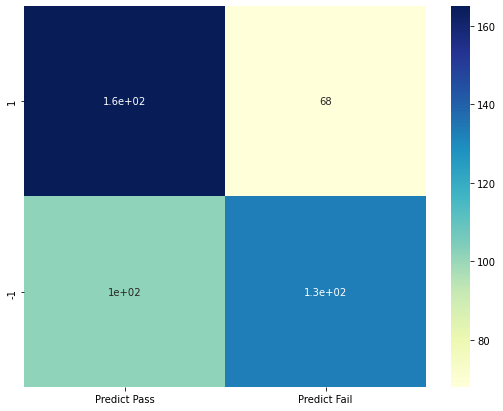

In [141]:
model_pca_lr = LogisticRegression(solver="liblinear", penalty="l1", C=1, random_state=10)
model_pca_lr.fit(X_train_21, y_train_21)
#predict on test
y_pred_logit_pca = model_pca_lr.predict(X_test_21)

model_score_train_pca = model_pca_lr.score(X_train_21, y_train_21)
print(model_score_train_pca)
print("")

cm=metrics.confusion_matrix(y_test_21, y_pred_logit_pca, labels=[1,-1])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","-1"]],
                  columns = [i for i in ["Predict Pass","Predict Fail"]])
plt.figure(figsize = (9,7))
sns.heatmap(df_cm, annot=True,cmap="YlGnBu")

print("Logistic regression PCA - Accuracy ",metrics.accuracy_score(y_test_21, y_pred_logit_pca))
print("Logistic regression PCA - Precision",metrics.precision_score(y_test_21, y_pred_logit_pca))
print("Logistic regression PCA - Recall   ",metrics.recall_score(y_test_21, y_pred_logit_pca))
print("Logistic regression PCA - F1 score ",metrics.f1_score(y_test_21, y_pred_logit_pca))
print("Logistic regression PCA - ROC      ",metrics.roc_auc_score(y_test_21, y_pred_logit_pca))


In [142]:
#  Training the KNN model with PCA

# ... Training base model for KNN

NNH_pca = KNeighborsClassifier(n_neighbors= 5, weights = 'distance' )
NNH_pca.fit(X_train_21, y_train_21)

#Predict testing set
y_pred_knn_pca = NNH_pca.predict(X_test_21)
#Check performance using accuracy

print("KNN PCA - Accuracy ",metrics.accuracy_score(y_test_21, y_pred_knn_pca))
print("KNN PCA - Precision",metrics.precision_score(y_test_21, y_pred_knn_pca))
print("KNN PCA - Recall   ",metrics.recall_score(y_test_21, y_pred_knn_pca))
print("KNN PCA - F1 score ",metrics.f1_score(y_test_21, y_pred_knn_pca))
print("KNN PCA - ROC      ",metrics.roc_auc_score(y_test_21, y_pred_knn_pca))


KNN PCA - Accuracy  0.8076923076923077
KNN PCA - Precision 0.7213622291021672
KNN PCA - Recall    1.0
KNN PCA - F1 score  0.8381294964028777
KNN PCA - ROC       0.8085106382978724


In [143]:
print("KNN Training score",NNH_pca.score(X_train_21,y_train_21))
print("KNN Validation score",NNH_pca.score(X_test_21,y_test_21))


KNN Training score 1.0
KNN Validation score 0.8076923076923077


[0.8328365001706679, 0.8141398338832632, 0.7895437478666515, 0.7809989759927183, 0.7681875071111617, 0.7612384799180794, 0.7569660939811127, 0.7404027761975196, 0.7377346683354192, 0.7281289111389238, 0.7227841620207077, 0.7174536352258505, 0.7142536124701331, 0.7051683923085675, 0.704630788485607]


Text(0, 0.5, 'Cross-Validated Accuracy')

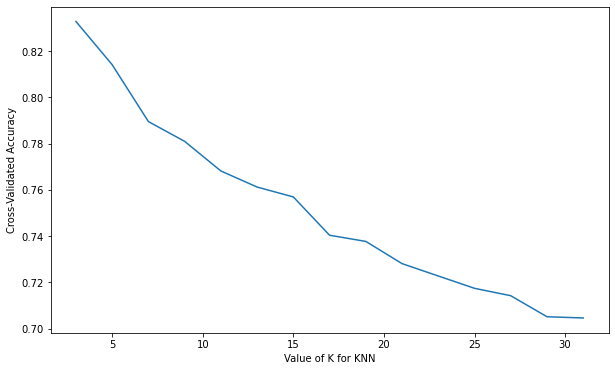

In [144]:
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_score

# search for an optimal value of K for KNN

# list of integers 3 to 31

k_range = range(3, 32, 2)

# list of scores from k_range
k_scores = []

# Looping through reasonable values of k
for k in k_range:
    # 2. run KNeighborsClassifier with k neighbours
    knn_pca = KNeighborsClassifier(n_neighbors=k)
    # 3. obtain cross_val_score for KNeighborsClassifier with k neighbours
    scores = cross_val_score(knn_pca, X_train_21, y_train_21, cv=10, scoring='accuracy')
    # 4. append mean of scores for k neighbors to k_scores list
    k_scores.append(scores.mean())
print(k_scores)

# plot the value of K for KNN (x-axis) versus the cross-validated accuracy (y-axis)

plt.figure(figsize = (10,6))
plt.plot(k_range, k_scores)
plt.xlabel('Value of K for KNN')
plt.ylabel('Cross-Validated Accuracy')

In [145]:
from sklearn.model_selection import GridSearchCV

#List Hyperparameters to tune
leaf_size = list(range(1,10))
n_neighbors = list(range(3,32,2))
p=[1,2]
#convert to dictionary
hyperparameters = dict(leaf_size=leaf_size, n_neighbors=n_neighbors, p=p)
#Making model
clf_pca = GridSearchCV(knn_pca, hyperparameters, cv=10)
best_model = clf_pca.fit(X_train_21,y_train_21)

#Best Hyperparameters Value
print('Best leaf_size:', best_model.best_estimator_.get_params()['leaf_size'])
print('Best p:', best_model.best_estimator_.get_params()['p'])
print('Best n_neighbors:', best_model.best_estimator_.get_params()['n_neighbors'])
print("")
#Predict testing set
y_pred_grid_knn_pca = best_model.predict(X_test_21)

print("GridSearchCV for KNN PCA - Accuracy ",metrics.accuracy_score(y_test_21, y_pred_grid_knn_pca))
print("GridSearchCV for KNN PCA - Precision",metrics.precision_score(y_test_21, y_pred_grid_knn_pca))
print("GridSearchCV for KNN PCA - Recall   ",metrics.recall_score(y_test_21, y_pred_grid_knn_pca))
print("GridSearchCV for KNN PCA - F1 score ",metrics.f1_score(y_test_21, y_pred_grid_knn_pca))

Best leaf_size: 1
Best p: 2
Best n_neighbors: 3

GridSearchCV for KNN PCA - Accuracy  0.8247863247863247
GridSearchCV for KNN PCA - Precision 0.7396825396825397
GridSearchCV for KNN PCA - Recall    1.0
GridSearchCV for KNN PCA - F1 score  0.8503649635036497


KNN PCA tuned - Accuracy  0.8247863247863247
KNN PCA tuned - Precision 0.7396825396825397
KNN PCA tuned - Recall    1.0
KNN PCA tuned - F1 score  0.8503649635036497


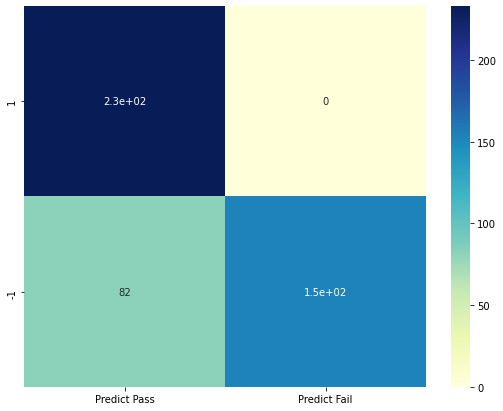

In [146]:
knn_pca = KNeighborsClassifier(n_neighbors= 3, weights = 'distance',leaf_size=1,p=2)

#Training the model
knn_pca.fit(X_train_21, y_train_21)
#Predict testing set
y_pred_knn_tune_pca1 = knn_pca.predict(X_test_21)

cm=metrics.confusion_matrix(y_test_21, y_pred_knn_tune_pca1, labels=[1,-1])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","-1"]],
                  columns = [i for i in ["Predict Pass","Predict Fail"]])
plt.figure(figsize = (9,7))
sns.heatmap(df_cm, annot=True,cmap="YlGnBu")

print("KNN PCA tuned - Accuracy ",metrics.accuracy_score(y_test_21, y_pred_knn_tune_pca1))
print("KNN PCA tuned - Precision",metrics.precision_score(y_test_21, y_pred_knn_tune_pca1))
print("KNN PCA tuned - Recall   ",metrics.recall_score(y_test_21, y_pred_knn_tune_pca1))
print("KNN PCA tuned - F1 score ",metrics.f1_score(y_test_21, y_pred_knn_tune_pca1))


In [147]:
# Training the SVC model with PCA

clf_pca = SVC(kernel='linear') 
  
# fitting x samples and y classes 
clf_pca.fit(X_train_21, y_train_21) 

y_pred_svc_pca = clf_pca.predict(X_test_21)

print("SVC - Accuracy ",metrics.accuracy_score(y_test_21, y_pred_svc_pca))
print("SVC - Precision",metrics.precision_score(y_test_21, y_pred_svc_pca))
print("SVC - Recall   ",metrics.recall_score(y_test_21, y_pred_svc_pca))
print("SVC - F1 Score ",metrics.f1_score(y_test_21, y_pred_svc_pca))
print("SVC - ROC Score",metrics.roc_auc_score(y_test_21, y_pred_svc_pca))


SVC - Accuracy  0.6517094017094017
SVC - Precision 0.6215277777777778
SVC - Recall    0.7682403433476395
SVC - F1 Score  0.6871401151631477
SVC - ROC Score 0.6522052780567984


In [148]:
# Trying Gridsearch for SVC with PCA

svc_pca = SVC()
parameters = [{"kernel": ["rbf"],"gamma":[0.1,0.01],"C":[0.1,1,10]},
              {"kernel": ["linear"],"C": [0.1,1,10]}]

cv_svc_pca = GridSearchCV(svc_pca,parameters,cv=5)
cv_svc_pca.fit(X_train_21, y_train_21) 

"""def display1(results):
    print(f'Best parameters are: {results.best_params_}')
    mean_score = results.cv_results_['mean_test_score']
    std_score = results.cv_results_['std_test_score']
    params = results.cv_results_['params']
    for mean,std,params in zip(mean_score,std_score,params):
        print(f'{round(mean,2)} + or -{round(std,2)} for the {params}')"""

display1(cv_svc_pca)

Best parameters are: {'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}

0.78 + or -0.02 for the {'C': 0.1, 'gamma': 0.1, 'kernel': 'rbf'}
0.69 + or -0.01 for the {'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
0.88 + or -0.02 for the {'C': 1, 'gamma': 0.1, 'kernel': 'rbf'}
0.73 + or -0.01 for the {'C': 1, 'gamma': 0.01, 'kernel': 'rbf'}
0.92 + or -0.02 for the {'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}
0.78 + or -0.03 for the {'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}
0.66 + or -0.01 for the {'C': 0.1, 'kernel': 'linear'}
0.66 + or -0.01 for the {'C': 1, 'kernel': 'linear'}
0.66 + or -0.01 for the {'C': 10, 'kernel': 'linear'}


SVC PCA - Accuracy  0.9294871794871795
SVC PCA - Precision 0.8816793893129771
SVC PCA - Recall    0.9914163090128756
SVC PCA - F1 Score  0.9333333333333332
SVC PCA - ROC Score 0.9297507076979271


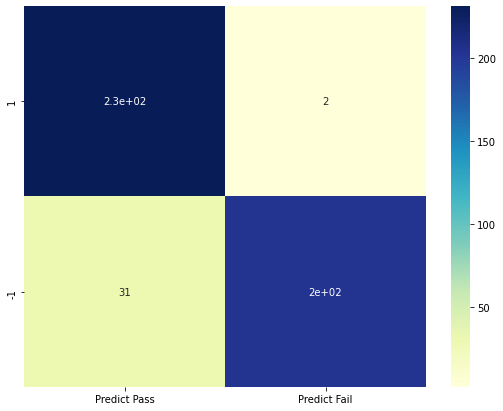

In [149]:
# Hyper tuned SVC model on PCA with GradientSearch recommended parameters

clf_pca = SVC(kernel='rbf', C = 10.0, gamma=0.1) 
  
# fitting x samples and y classes 
clf_pca.fit(X_train_21, y_train_21) 

y_pred_svc_pca1 = clf_pca.predict(X_test_21)

cm=metrics.confusion_matrix(y_test_21, y_pred_svc_pca1, labels=[1,-1])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","-1"]],
                  columns = [i for i in ["Predict Pass","Predict Fail"]])
plt.figure(figsize = (9,7))
sns.heatmap(df_cm, annot=True,cmap="YlGnBu")

print("SVC PCA - Accuracy ",metrics.accuracy_score(y_test_21, y_pred_svc_pca1))
print("SVC PCA - Precision",metrics.precision_score(y_test_21, y_pred_svc_pca1))
print("SVC PCA - Recall   ",metrics.recall_score(y_test_21, y_pred_svc_pca1))
print("SVC PCA - F1 Score ",metrics.f1_score(y_test_21, y_pred_svc_pca1))
print("SVC PCA - ROC Score",metrics.roc_auc_score(y_test_21, y_pred_svc_pca1))


Decision tree PCA Training score 1.0
Decision tree PCA Validation score 0.8162393162393162

Decision Tree PCA - Accuracy  0.8162393162393162
Decision Tree PCA - Precision 0.788235294117647
Decision Tree PCA - Recall    0.8626609442060086
Decision Tree PCA - F1 score  0.8237704918032787
Decision Tree PCA - ROC       0.8164368550817277


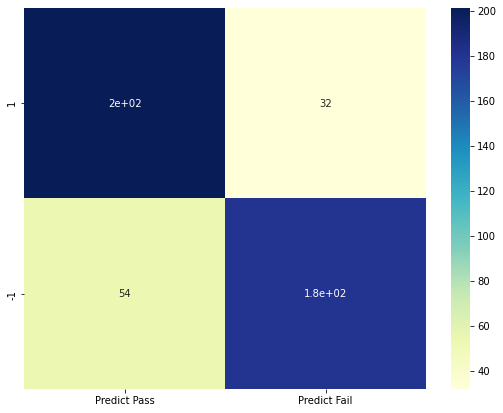

In [150]:
# Training the Decision tree model with PCA 

dt_model_pca = DecisionTreeClassifier(criterion = 'gini', random_state=1)
dt_model_pca.fit(X_train_21, y_train_21)

print("Decision tree PCA Training score",dt_model_pca.score(X_train_21, y_train_21))
print("Decision tree PCA Validation score",dt_model_pca.score(X_test_21, y_test_21))
print("")

y_pred_dt_pca = dt_model_pca.predict(X_test_21)

cm=metrics.confusion_matrix(y_test_21, y_pred_dt_pca, labels=[1,-1])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","-1"]],
                  columns = [i for i in ["Predict Pass","Predict Fail"]])
plt.figure(figsize = (9,7))
sns.heatmap(df_cm, annot=True,cmap="YlGnBu")

print("Decision Tree PCA - Accuracy ",metrics.accuracy_score(y_test_21, y_pred_dt_pca))
print("Decision Tree PCA - Precision",metrics.precision_score(y_test_21, y_pred_dt_pca))
print("Decision Tree PCA - Recall   ",metrics.recall_score(y_test_21, y_pred_dt_pca))
print("Decision Tree PCA - F1 score ",metrics.f1_score(y_test_21, y_pred_dt_pca))
print("Decision Tree PCA - ROC      ",metrics.roc_auc_score(y_test_21, y_pred_dt_pca))


In [152]:
# Training the Ramdom Forest model using PCA

clf_pca_rf = RandomForestClassifier(max_depth=4, n_estimators=100, random_state=0, )
clf_pca_rf.fit(X_train_21, y_train_21)

print("Random forest PCA Training score",clf_pca_rf.score(X_train_21, y_train_21))
print("Random forest PCA Validation score",clf_pca_rf.score(X_test_21, y_test_21))
print("")

y_pred_rf_pca = clf_pca_rf.predict(X_test_21)

print("Random forest PCA - Accuracy ",metrics.accuracy_score(y_test_21, y_pred_rf_pca))
print("Random forest PCA - Precision",metrics.precision_score(y_test_21, y_pred_rf_pca))
print("Random forest PCA - Recall   ",metrics.recall_score(y_test_21, y_pred_rf_pca))
print("Random forest PCA - F1 score ",metrics.f1_score(y_test_21, y_pred_rf_pca))
# print("Random forest PCA - ROC      ",metrics.roc_auc_score(y_test_21, y_pred_rf_pca))

Random forest PCA Training score 0.7911324786324786
Random forest PCA Validation score 0.7435897435897436

Random forest PCA - Accuracy  0.7435897435897436
Random forest PCA - Precision 0.6968641114982579
Random forest PCA - Recall    0.8583690987124464
Random forest PCA - F1 score  0.7692307692307693
Random forest PCA - ROC       0.7440781663774998


In [153]:
# Using Gridsearch CV to identify best parameters in RF with PCA

rfc_pca = RandomForestClassifier(n_jobs=-1,max_features= 'sqrt' ,n_estimators=50, oob_score = True) 

param_grid_pca_rf = { 
    'n_estimators': [100,150,200,250],
       'max_depth': [3,4,5],
    'max_features': ['auto', 'sqrt', 'log2']
}

CV_rfc_pca = GridSearchCV(estimator=rfc_pca, param_grid=param_grid_pca_rf, cv= 5)
CV_rfc_pca.fit(X_train_21, y_train_21)

display1(CV_rfc_pca)

Best parameters are: {'max_depth': 5, 'max_features': 'log2', 'n_estimators': 100}

0.73 + or -0.02 for the {'max_depth': 3, 'max_features': 'auto', 'n_estimators': 100}
0.73 + or -0.03 for the {'max_depth': 3, 'max_features': 'auto', 'n_estimators': 150}
0.73 + or -0.02 for the {'max_depth': 3, 'max_features': 'auto', 'n_estimators': 200}
0.72 + or -0.03 for the {'max_depth': 3, 'max_features': 'auto', 'n_estimators': 250}
0.73 + or -0.02 for the {'max_depth': 3, 'max_features': 'sqrt', 'n_estimators': 100}
0.72 + or -0.02 for the {'max_depth': 3, 'max_features': 'sqrt', 'n_estimators': 150}
0.73 + or -0.02 for the {'max_depth': 3, 'max_features': 'sqrt', 'n_estimators': 200}
0.73 + or -0.02 for the {'max_depth': 3, 'max_features': 'sqrt', 'n_estimators': 250}
0.72 + or -0.02 for the {'max_depth': 3, 'max_features': 'log2', 'n_estimators': 100}
0.73 + or -0.02 for the {'max_depth': 3, 'max_features': 'log2', 'n_estimators': 150}
0.73 + or -0.02 for the {'max_depth': 3, 'max_features':

Random forest Training PCA best score 0.8215811965811965
Random forest Validation PCA best score 0.7735042735042735

Random forest PCA best - Accuracy  0.7735042735042735
Random forest PCA best - Precision 0.7275985663082437
Random forest PCA best - Recall    0.871244635193133
Random forest PCA best - F1 score  0.79296875
Random forest PCA best - ROC       0.7739201899369921



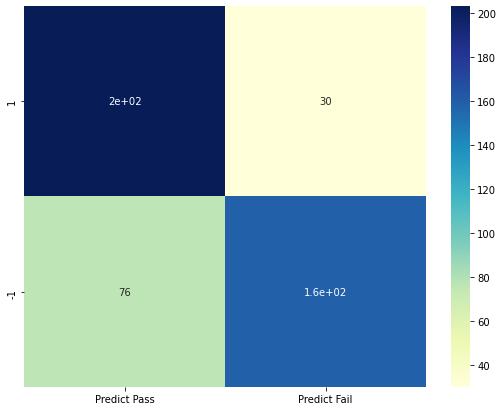

In [157]:
# Hyper tuned using Gridsearch CV recommended best parameters on RF with PCA

clf_pca_rf2 = RandomForestClassifier(max_depth=5, max_features= 'log2', n_estimators=100, random_state=0, )

clf_pca_rf2.fit(X_train_21, y_train_21)

print("Random forest Training PCA best score",clf_pca_rf2.score(X_train_21, y_train_21))
print("Random forest Validation PCA best score",clf_pca_rf2.score(X_test_21, y_test_21))
print("")

y_pred_rf_pca2 = clf_pca_rf2.predict(X_test_21)

cm=metrics.confusion_matrix(y_test_21, y_pred_rf_pca2, labels=[1,-1])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","-1"]],
                  columns = [i for i in ["Predict Pass","Predict Fail"]])
plt.figure(figsize = (9,7))
sns.heatmap(df_cm, annot=True,cmap="YlGnBu")

print("Random forest PCA best - Accuracy ",metrics.accuracy_score(y_test_21, y_pred_rf_pca2))
print("Random forest PCA best - Precision",metrics.precision_score(y_test_21, y_pred_rf_pca2))
print("Random forest PCA best - Recall   ",metrics.recall_score(y_test_21, y_pred_rf_pca2))
print("Random forest PCA best - F1 score ",metrics.f1_score(y_test_21, y_pred_rf_pca2))
print("Random forest PCA best - ROC      ",metrics.roc_auc_score(y_test_21, y_pred_rf_pca2))
print("")



In [158]:
# Training Gradient Boosting model with PCA

gbcl_pca = GradientBoostingClassifier(n_estimators = 100, learning_rate = 0.08, random_state=1)
gbcl_pca_1 = gbcl_pca.fit(X_train_21, y_train_21)

print("Gradient Boost PCA Training score",gbcl_pca_1.score(X_train_21,y_train_21))
print("Gradient Boost PCA Validation score",gbcl_pca_1.score(X_test_21,y_test_21))
print("")

y_pred_gbc_pca1 = gbcl_pca_1.predict(X_test_21)

print("GBCL PCA - Accuracy ",metrics.accuracy_score(y_test_21, y_pred_gbc_pca1))
print("GBCL PCA - Precision",metrics.precision_score(y_test_21, y_pred_gbc_pca1))
print("GBCL PCA - Recall   ",metrics.recall_score(y_test_21, y_pred_gbc_pca1))
print("GBCL PCA - F1 score ",metrics.f1_score(y_test_21, y_pred_gbc_pca1))
print("GBCL PCA - ROC      ",metrics.roc_auc_score(y_test_21, y_pred_gbc_pca1))
print("")



Gradient Boost PCA Training score 0.8872863247863247
Gradient Boost PCA Validation score 0.8055555555555556

GBCL PCA - Accuracy  0.8055555555555556
GBCL PCA - Precision 0.7669172932330827
GBCL PCA - Recall    0.8755364806866953
GBCL PCA - F1 score  0.8176352705410822
GBCL PCA - ROC       0.8058533467263264



In [159]:
# Finding out the best parameters for GBCL using GridsearchCV with PCA

parameters = {
    "learning_rate": [0.025, 0.05, 0.075],    
    "max_depth":[3,5,8],
    "max_features":["log2","sqrt"],       
    "n_estimators":[100,125,150]
    }

clf_pca_gbcl2 = GridSearchCV(GradientBoostingClassifier(), parameters, cv=5, n_jobs=-1)

clf_pca_gbcl2.fit(X_train_21, y_train_21)

display1(clf_pca_gbcl2)

Best parameters are: {'learning_rate': 0.075, 'max_depth': 8, 'max_features': 'sqrt', 'n_estimators': 150}

0.76 + or -0.02 for the {'learning_rate': 0.025, 'max_depth': 3, 'max_features': 'log2', 'n_estimators': 100}
0.77 + or -0.03 for the {'learning_rate': 0.025, 'max_depth': 3, 'max_features': 'log2', 'n_estimators': 125}
0.78 + or -0.02 for the {'learning_rate': 0.025, 'max_depth': 3, 'max_features': 'log2', 'n_estimators': 150}
0.76 + or -0.02 for the {'learning_rate': 0.025, 'max_depth': 3, 'max_features': 'sqrt', 'n_estimators': 100}
0.77 + or -0.02 for the {'learning_rate': 0.025, 'max_depth': 3, 'max_features': 'sqrt', 'n_estimators': 125}
0.78 + or -0.02 for the {'learning_rate': 0.025, 'max_depth': 3, 'max_features': 'sqrt', 'n_estimators': 150}
0.82 + or -0.01 for the {'learning_rate': 0.025, 'max_depth': 5, 'max_features': 'log2', 'n_estimators': 100}
0.82 + or -0.01 for the {'learning_rate': 0.025, 'max_depth': 5, 'max_features': 'log2', 'n_estimators': 125}
0.84 + or -0

Gradient Boost PCA best Training score 1.0
Gradient Boost PCA best Validation score 0.9017094017094017

XGB PCA best - Accuracy  0.9017094017094017
XGB PCA best - Precision 0.8695652173913043
XGB PCA best - Recall    0.944206008583691
XGB PCA best - F1 score  0.9053497942386831
XGB PCA best - ROC       0.9018902383343987



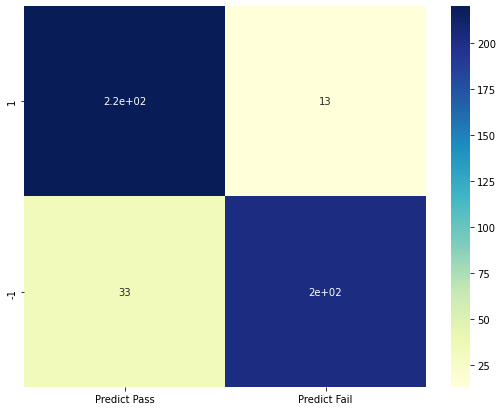

In [161]:
# Hyper tuning Gridsearch CV recommended parameters to GBCL with PCA

gbcl_pca = GradientBoostingClassifier(n_estimators = 150, learning_rate = 0.075, max_depth = 8, max_features='sqrt',random_state=1)
gbcl_pca_2 = gbcl_pca.fit(X_train_21, y_train_21)

print("Gradient Boost PCA best Training score",gbcl_pca_2.score(X_train_21,y_train_21))
print("Gradient Boost PCA best Validation score",gbcl_pca_2.score(X_test_21,y_test_21))
print("")

y_pred_gbc_pca2 = gbcl_pca_2.predict(X_test_21)

cm=metrics.confusion_matrix(y_test_21, y_pred_gbc_pca2, labels=[1,-1])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","-1"]],
                  columns = [i for i in ["Predict Pass","Predict Fail"]])
plt.figure(figsize = (9,7))
sns.heatmap(df_cm, annot=True,cmap="YlGnBu")

print("XGB PCA best - Accuracy ",metrics.accuracy_score(y_test_21, y_pred_gbc_pca2))
print("XGB PCA best - Precision",metrics.precision_score(y_test_21, y_pred_gbc_pca2))
print("XGB PCA best - Recall   ",metrics.recall_score(y_test_21, y_pred_gbc_pca2))
print("XGB PCA best - F1 score ",metrics.f1_score(y_test_21, y_pred_gbc_pca2))
print("XGB PCA best - ROC      ",metrics.roc_auc_score(y_test_21, y_pred_gbc_pca2))
print("")


In [ ]:
#  5E........... Displaying and Explaining the Classification report in Detail

So Lets do the final comparison between the (VALIDATION SCORES) got without PCA and with PCA

Best scores by different models with 21 Predictors         	Best scores by different models with PCA of 10
	
1) Logistic Regression                                  	1) Logistic Regression
	
Logistic reg - Accuracy  0.7072649572649573             	Logistic reg PCA - Accuracy  0.6367521367521367
Logistic reg - Precision 0.6910569105691057             	Logistic reg PCA - Precision 0.6179775280898876
Logistic reg - Recall    0.7359307359307359             	Logistic reg PCA - Recall    0.7081545064377682
Logistic reg - F1 score  0.7127882599580712             	Logistic reg PCA - F1 score  0.66
Logistic reg - ROC       0.7076278152227519             	Logistic reg PCA - ROC       0.6370559766231394
	
2) KNN Classifier                                       	2) KNN Classifier
	
KNN - Accuracy  0.8183760683760684                      	KNN PCA tuned - Accuracy  0.8247863247863247
KNN - Precision 0.7310126582278481                      	KNN PCA tuned - Precision 0.7396825396825397
KNN - Recall    1.0                                     	KNN PCA tuned - Recall    1.0
KNN - F1 score  0.8446069469835467                      	KNN PCA tuned - F1 score  0.8503649635036497
	
3) Support Vector Classifier                            	3) Support Vector Classifier
	
SVC - Accuracy  0.9636752136752137                      	SVC PCA - Accuracy  0.9294871794871795
SVC - Precision 0.9385245901639344                      	SVC PCA - Precision 0.8816793893129771
SVC - Recall    0.9913419913419913                      	SVC PCA - Recall    0.9914163090128756
SVC - F1 Score  0.9642105263157894                      	SVC PCA - F1 Score  0.9333333333333332
SVC - ROC Score 0.9640254260507426                      	SVC PCA - ROC Score 0.9297507076979271
	
4) Decision Tree Classifier                             	4) Decision Tree Classifier
	
Decision Tree - Accuracy  0.844017094017094             	Decision Tree PCA - Accuracy  0.8162393162393162
Decision Tree - Precision 0.7992424242424242            	Decision Tree PCA - Precision 0.788235294117647
Decision Tree - Recall    0.9134199134199135            	Decision Tree PCA - Recall    0.8626609442060086
Decision Tree - F1 score  0.8525252525252526            	Decision Tree PCA - F1 score  0.8237704918032787
Decision Tree - ROC       0.8448956107183957            	Decision Tree PCA - ROC       0.8164368550817277
                	
5) Random Forest Classifier                             	5) Random Forest Classifier
	
Random forest - Accuracy  0.8397435897435898            	Random forest PCA best - Accuracy  0.7735042735042735
Random forest - Precision 0.7785714285714286            	Random forest PCA best - Precision 0.7275985663082437
Random forest - Recall    0.9437229437229437            	Random forest PCA best - Recall    0.871244635193133
Random forest - F1 score  0.853228962818004             	Random forest PCA best - F1 score  0.79296875
Random forest - ROC       0.8410597840977587            	Random forest PCA best - ROC       0.7739201899369921
	
6) Gradient Boosting Classifier                         	6) Gradient Boosting Classifier
	
XGB - Accuracy  0.9658119658119658                      	XGB PCA best - Accuracy  0.9017094017094017
XGB - Precision 0.946058091286307                       	XGB PCA best - Precision 0.8695652173913043
XGB - Recall    0.987012987012987                       	XGB PCA best - Recall    0.944206008583691
XGB - F1 score  0.9661016949152542                      	XGB PCA best - F1 score  0.9053497942386831
XGB - ROC       0.9660803331689407                      	XGB PCA best - ROC       0.9018902383343987


In [ ]:

    Quick summary on Data Cleansing and Pre-processing
    
    1. Started out with 592 column Dataset
    2. Dropped 338 columns since they had missing values greater than 20% and reduced dataset to 254 columns
    3. Dropped 16 columns since they had a std deviation of 0 (No variation at all) and reduced dataset to 238 columns
    4. Dropped Time column since it was not adding much value towards the Target and reduced dataset to 237 columns
    5. Dropped 38 columns since their variance was less than 2% and reduced dataset to 199 columns
    6. Dropped 50 worst negatively correlated columns and reduced the dataset to 149 columns
    7. Dropped 50 worst positively correlated columns and reduced the dataset to 99 columns
    8. Dropped 77 columns iteratively with highest VIF and then looped around to recalcuate VIF again.
    
    9. After the 8th round the Final dataset was brought down to 22 columns
    10. The last corr() heatmap showed 2 more predictors which had a strong correlation, so dropped one of them
    
    11. This brought the Final dataset to 21 columns - 20 Predictors and 1 Target variable
    
    Other important Cleansing and Pre-processing activities
    
    a) There were lots of outliers in the 20 Predictors so they were all imputed with Median values
    b) The Target variable had a huge imbalance 93% vs 6.6% so used SMOTE to balance them out
    c) The 1567 rows dataset was split into 80% Train and 20% Test
    d) This 20% Test data was kept aside for the Final testing
    e) The 80% Train data was further split into 80% Training and 20% Validation datasets
    f) All the Algorithms were fitted and trained on the 80% of 80% Training dataset and
    g) 20% of the 80% Training data set was used as Validation dataset to Validate the algorithms
    
   

In [ ]:
 Observations on the Training and Validation scores
    
    1. All of the above are Validation scores from 6 different Machine Learning Algorithm
    2. Left hand side Validation scores are from the 20 Predictors
    3. Right hand side Validation scores are from 10 PCA components
    4. We can see a trend that Left hand side scores are slightly better on a 1-1 comparison with the Right hand scores
    5. So PCA has shown a trend of scores consistently going down across all the Machine Learning Algorithms 
    6. We can clearly see that the 22 Predictors when used as is gave a better score than the PCA of 10 components
    
    7. This could probably be because the Multi-collinearlity was almost removed from the Predictor dataset with 
    Data Cleansing and on top of that when PCA was applied the 10 components might probably not have explained 
    all the 22 predictors fully and hence the reduced scores.
    
        As one can see Total Variance explained by the PCA of 10 gave us only 74%.
    
            Variance of each component: [19.04400713  9.39580621  8.00407899  7.24779439  5.65543873  5.3769298
                                          5.27887025  5.17678718  4.60017507  4.21570919]

            Total Variance Explained: 74.0
                
            Probably a higher choice of PCA which could have explained the variance to 90% might have given better 
            scores.
              
    8. So let us concentrate on the Left hand side Validation Scores and Ignore the right hand side scores (PCA scores)
    
    9. Among all the ML Algorithms Support Vector Classifier and Gradient Boosting Ensemble Algorithm has given almost 
    matching scores

In [ ]:
Hence we will use the SVC model and Gradient Boosting models to do the Final testing with the Test set kept aside
in the first Train_Test_Split and create a Pickle out of them

# 6. Post Training and Conclusion

In [ ]:
# 6A........ Dispaly and compare all the models with 20 Original Predictors showing Training and Final test data

In [166]:
# Logistic regression on the Original Training and Testing datasets with 20 Predictors (Not PCA)

model_final_lr = LogisticRegression(solver="saga", penalty="l1", C=1, random_state=10)

model_final_lr.fit(X_train, y_train)  # Against the Original 80% Training data (which includes the Validation data too)

#predict on test
y_pred_logit_final = model_final_lr.predict(X_test) # Testing against the Original 20% Test data

model_score_train_final = model_final_lr.score(X_train, y_train)

print("Logistic Regression Final Training score",model_final_lr.score(X_train, y_train))
print("Logistic Regression Final Testing score",model_final_lr.score(X_test, y_test))
print("")

print("Logistic regression Final - Accuracy ",metrics.accuracy_score(y_test, y_pred_logit_final))
print("Logistic regression Final - Precision",metrics.precision_score(y_test, y_pred_logit_final))
print("Logistic regression Final - Recall   ",metrics.recall_score(y_test, y_pred_logit_final))
print("Logistic regression Final - F1 score ",metrics.f1_score(y_test, y_pred_logit_final))
print("Logistic regression Final - ROC      ",metrics.roc_auc_score(y_test, y_pred_logit_final))


Logistic Regression Final Training score 0.6901709401709402
Logistic Regression Final Testing score 0.6757679180887372

Logistic regression Final - Accuracy  0.6757679180887372
Logistic regression Final - Precision 0.6589403973509934
Logistic regression Final - Recall    0.6958041958041958
Logistic regression Final - F1 score  0.6768707482993198
Logistic regression Final - ROC       0.6762354312354313


In [167]:
# KNN Classification on the Original Training and Testing datasets with 20 Predictors (Not PCA)

knn_final = KNeighborsClassifier(n_neighbors= 3, weights = 'distance',leaf_size=1,p=1)

#Training the model

knn_final.fit(X_train, y_train)

print("KNN Final Training score",knn_final.score(X_train, y_train))
print("KNN Final Testing score",knn_final.score(X_test, y_test))
print("")

#Predict testing set

y_pred_knn_final = knn_final.predict(X_test)  # Predicting against the Original 20% Test data

print("KNN Final - Accuracy ",metrics.accuracy_score(y_test, y_pred_knn_final))
print("KNN Final - Precision",metrics.precision_score(y_test, y_pred_knn_final))
print("KNN Final - Recall   ",metrics.recall_score(y_test, y_pred_knn_final))
print("KNN Final - F1 score ",metrics.f1_score(y_test, y_pred_knn_final))


KNN Final Training score 1.0
KNN Final Testing score 0.8088737201365188

KNN Final - Accuracy  0.8088737201365188
KNN Final - Precision 0.7196969696969697
KNN Final - Recall    0.9965034965034965
KNN Final - F1 score  0.8357771260997068


In [168]:
# SVC Classification on the Original Training and Testing datasets with 20 Predictors (Not PCA)

clf_svc_final = SVC(kernel='rbf',C = 10.0,gamma=0.1) 
  
# fitting x samples and y classes 

clf_svc_final.fit(X_train, y_train) 

print("SVC Final Training score",clf_svc_final.score(X_train, y_train))
print("SVC Final Testing score",clf_svc_final.score(X_test, y_test))
print("")

y_pred_svc_final = clf_svc_final.predict(X_test)

print("SVC Final - Accuracy ",metrics.accuracy_score(y_test, y_pred_svc_final))
print("SVC Final - Precision",metrics.precision_score(y_test, y_pred_svc_final))
print("SVC Final - Recall   ",metrics.recall_score(y_test, y_pred_svc_final))
print("SVC Final - F1 Score ",metrics.f1_score(y_test, y_pred_svc_final))
print("SVC Final - ROC Score",metrics.roc_auc_score(y_test, y_pred_svc_final))


SVC Final Training score 0.9995726495726496
SVC Final Testing score 0.9744027303754266

SVC Final - Accuracy  0.9744027303754266
SVC Final - Precision 0.9593220338983051
SVC Final - Recall    0.9895104895104895
SVC Final - F1 Score  0.9741824440619621
SVC Final - ROC Score 0.9747552447552448


In [165]:
# Decision tree Classifier on the Original Training and Testing datasets with 20 Predictors (Not PCA)

dt_model_final = DecisionTreeClassifier(criterion = 'gini', random_state=1)
dt_model_final.fit(X_train, y_train)

print("Decision tree Final Training score",dt_model_final.score(X_train, y_train))
print("Decision tree Final Testing score",dt_model_final.score(X_test, y_test))
print("")

y_pred_dt_final = dt_model_final.predict(X_test)

print("Decision Tree Final - Accuracy ",metrics.accuracy_score(y_test, y_pred_dt_final))
print("Decision Tree Final - Precision",metrics.precision_score(y_test, y_pred_dt_final))
print("Decision Tree Final - Recall   ",metrics.recall_score(y_test, y_pred_dt_final))
print("Decision Tree Final - F1 score ",metrics.f1_score(y_test, y_pred_dt_final))
print("Decision Tree Final - ROC      ",metrics.roc_auc_score(y_test, y_pred_dt_final))


Decision tree Final Training score 1.0
Decision tree Final Testing score 0.856655290102389

Decision Tree Final - Accuracy  0.856655290102389
Decision Tree Final - Precision 0.8300653594771242
Decision Tree Final - Recall    0.8881118881118881
Decision Tree Final - F1 score  0.8581081081081081
Decision Tree Final - ROC       0.8573892773892774


In [169]:
# Random Forest Classifier on the Original Training and Testing datasets with 20 Predictors (Not PCA)

clf_final_rf = RandomForestClassifier(max_depth=5, max_features= 'sqrt', n_estimators=250, random_state=0, )

clf_final_rf.fit(X_train, y_train)

print("Random forest Final Training score",clf_final_rf.score(X_train, y_train))
print("Random forest Final Testing score",clf_final_rf.score(X_test, y_test))
print("")

y_pred_rf_final = clf_final_rf.predict(X_test)

print("Random forest Final - Accuracy ",metrics.accuracy_score(y_test, y_pred_rf_final))
print("Random forest Final - Precision",metrics.precision_score(y_test, y_pred_rf_final))
print("Random forest Final - Recall   ",metrics.recall_score(y_test, y_pred_rf_final))
print("Random forest Final - F1 score ",metrics.f1_score(y_test, y_pred_rf_final))
print("Random forest Final - ROC      ",metrics.roc_auc_score(y_test, y_pred_rf_final))
print("")

feature_imp_final = pd.Series(clf_final_rf.feature_importances_,index=X_train.columns).sort_values(ascending=False)

feature_imp_final


Random forest Final Training score 0.8572649572649572
Random forest Final Testing score 0.810580204778157

Random forest Final - Accuracy  0.810580204778157
Random forest Final - Precision 0.7478753541076487
Random forest Final - Recall    0.9230769230769231
Random forest Final - F1 score  0.8262910798122065
Random forest Final - ROC       0.8132051282051282



33     0.154838
28     0.129151
160    0.093937
32     0.073290
27     0.071062
21     0.061350
26     0.048804
31     0.048494
14     0.040316
163    0.038878
30     0.030030
24     0.027745
22     0.026759
170    0.026706
165    0.025918
161    0.025118
159    0.023195
164    0.021799
9      0.017957
166    0.014653
dtype: float64

In [170]:
# Gradient Boosting Classifier on the Original Training and Testing datasets with 20 Predictors (Not PCA)

gbcl_final = GradientBoostingClassifier(n_estimators = 150, learning_rate = 0.075, max_depth = 8, max_features='sqrt',random_state=1)
gbcl_final = gbcl_final.fit(X_train, y_train)

print("Gradient Boost Final Training score",gbcl_final.score(X_train,y_train))
print("Gradient Boost Final Testing score",gbcl_final.score(X_test,y_test))
print("")

y_pred_gbc_final = gbcl_final.predict(X_test)

print("XGB Final - Accuracy ",metrics.accuracy_score(y_test, y_pred_gbc_final))
print("XGB Final - Precision",metrics.precision_score(y_test, y_pred_gbc_final))
print("XGB Final - Recall   ",metrics.recall_score(y_test, y_pred_gbc_final))
print("XGB Final - F1 score ",metrics.f1_score(y_test, y_pred_gbc_final))
print("XGB Final - ROC      ",metrics.roc_auc_score(y_test, y_pred_gbc_final))
print("")

feature_importances_final = pd.DataFrame(gbcl_final.feature_importances_,
                                   index = X_train.columns,
                                    columns=['importance']).sort_values('importance', ascending=False)

feature_importances_final

Gradient Boost Final Training score 1.0
Gradient Boost Final Testing score 0.9453924914675768

XGB Final - Accuracy  0.9453924914675768
XGB Final - Precision 0.9177631578947368
XGB Final - Recall    0.9755244755244755
XGB Final - F1 score  0.9457627118644069
XGB Final - ROC       0.946095571095571



,importance
33,0.106106
160,0.077812
28,0.067678
32,0.065955
27,0.058313
14,0.055722
170,0.050974
21,0.049254
31,0.048402
163,0.047745


In [ ]:
#  6B.... Final best trained model with comments

The Final Best trained model is Support Vector Classifier.

In the Previous round when we were testing against the subset of Training and Validation set both the SVC and
Gradient Boosting Classfier was found to be almost close to good scores.

But in the Final Training and Testing round we got the following results

SVC Final Training score 0.9995726495726496
SVC Final Testing score 0.9744027303754266

Gradient Boost Final Training score 1.0
Gradient Boost Final Testing score 0.9453924914675768

SVC is not only scores better on Bias as well as in Variance

SVC bias     = (1 - 0.99)/0.99    = 0.0005
SVC variance = (0.99 - 0.97)/0.97 = 0.02

XGB bias     = (1 - 1)/1       = 0
XGB variance = (1 - 0.94)/0.94 = 0.063

Hence SVC is a Low bias and Low variance model 

In [171]:
# 6C.... Creating a pickle for SVC model

import pickle

pickle.dump(clf_svc_final, open('svc_model_signal.pkl','wb'))  # writing the model to a pickle file in binary mode.

# load model
with open('svc_model_signal.pkl', 'rb') as f:
    loaded_classifier = pickle.load(f)

# predict
y_true = y_test
y_pred_svc_signal = loaded_classifier.predict(X_test)
print("")
print('pickle for Signal dataset SVC classifier: accuracy:', metrics.accuracy_score(y_true, y_pred_svc_signal))


pickle for Signal dataset SVC classifier: accuracy: 0.9744027303754266


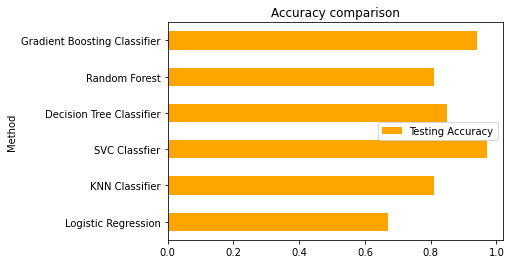

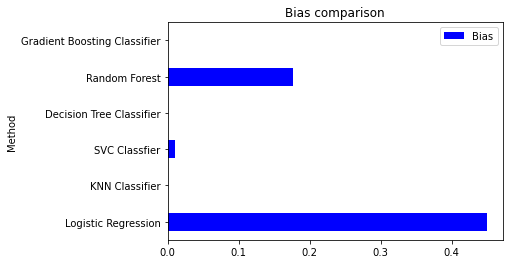

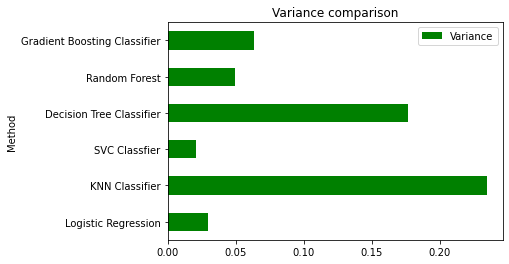

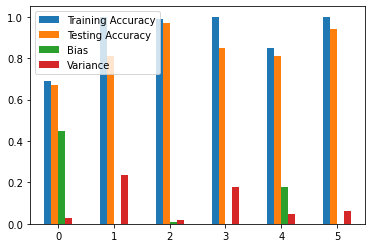

In [180]:
# 6D......... Conclusions

signal_score = pd.DataFrame(['Method'], ['Training Accuracy'], ['Testing Accuracy'])

score = {
    'Method' : ['Logistic Regression', 'KNN Classifier', 'SVC Classfier', 'Decision Tree Classifier', 'Random Forest', 'Gradient Boosting Classifier' ],
    'Training Accuracy' : [0.69, 1.00, 0.99, 1.00, 0.85, 1.00],
    'Testing Accuracy' :  [0.67, 0.81, 0.97, 0.85, 0.81, 0.94],
}

signal_score = pd.DataFrame(score)

signal_score['Bias'] = (1 - signal_score['Training Accuracy'])/signal_score['Training Accuracy']
signal_score['Variance'] = (signal_score['Training Accuracy'] - signal_score['Testing Accuracy'])/signal_score['Testing Accuracy']
                        

signal_score.plot.barh(x='Method', y='Testing Accuracy', title='Accuracy comparison', color='orange')
signal_score.plot.barh(x='Method', y='Bias', title='Bias comparison', color='blue')
signal_score.plot.barh(x='Method', y='Variance', title='Variance comparison', color='green')
        
ax = signal_score.plot.bar(rot=0)

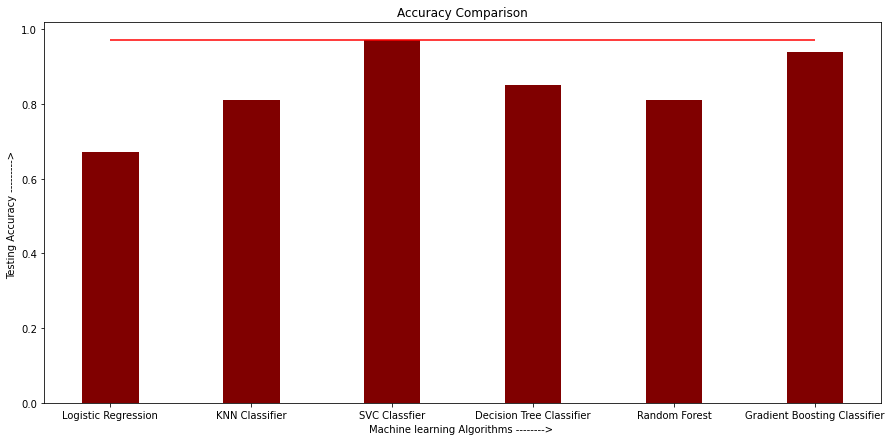

In [183]:
# creating the bar plot
fig = plt.figure(figsize =(15, 7))

plt.bar(signal_score['Method'], signal_score['Testing Accuracy'], color ='maroon',
        width = 0.4)

plt.hlines(0.97, 'Logistic Regression', 'Gradient Boosting Classifier', color='red')

plt.xlabel("Machine learning Algorithms --------> ")
plt.ylabel("Testing Accuracy ---------> ")
plt.title("Accuracy Comparison")
plt.show()

In [ ]:
SVM is better for two class classification problem and when number of features is less

1. It is more accurate that it's competitors.
2. It is more robust i.e. due to optimal margin gap between separating hyper planes, it could do predictions better with 
test data.
3. It is computationally more efficient. This is because of using Kernel trick in dual problem.
4. SVM take cares of outliers better than KNN.

Thus it is faster in training, better in accuracy with stability/robustness.